In [115]:
import matplotlib
import matplotlib.pyplot as plt
import plotly.graph_objects as go

import glob
import os

from src.OrganoidMesh import OrganoidMesh
from src.mesh_analysis import *
from src.nonlocal_correlations import *
from src.cell_graph_functions import *
from src.utils import *

In [116]:
import networkx as nx
import numpy as np

def load_cell_graph_from_npz(data: np.lib.npyio.NpzFile) -> nx.Graph:
    """
    Reconstruct a NetworkX graph from edges and node count stored in an NPZ file.
    This matches the new preprocessing format where `edges` and `n_nodes`
    are explicitly saved.
    """
    if "graph_edges" not in data.files or "graph_n_nodes" not in data.files:
        raise KeyError("NPZ file must contain 'edges' and 'n_nodes' to load the cell graph.")

    edges = data["graph_edges"]
    n_nodes = int(data["graph_n_nodes"])

    G = nx.Graph()
    G.add_nodes_from(range(n_nodes))

    if edges.size > 0:
        edges = edges.reshape(-1, 2)
        G.add_edges_from(edges.tolist())

    return G


## Load pre-processed organoids

In [117]:
dmax = 20
nbins = 32
bin_edges = np.linspace(0.0, dmax, nbins + 1)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

k_value = 3 # kNN analysis
n_perms = 999

In [118]:
# Base directory for preprocessed data
preproc_base = os.path.join('..', 'NicoleData', 'preprocessed')

# --- Discover available timepoints dynamically ---
timepoints = sorted(
    [d for d in os.listdir(preproc_base) if os.path.isdir(os.path.join(preproc_base, d))]
)
print(f"Found {len(timepoints)} timepoints: {timepoints}")

# --- Initialize global container ---
results = {}

for tp in timepoints:
    print(f"\n=== Analyzing timepoint: {tp} ===")

    tp_dir = os.path.join(preproc_base, tp)
    npz_files = sorted(glob.glob(os.path.join(tp_dir, "*.npz")))
    if not npz_files:
        print(f"  ⚠ No .npz files found for {tp}, skipping.")
        continue

    # --- Per-timepoint containers ---
    Corr_all_list = []
    Corr_conn_all_list = []
    Enrichment_all_list = []
    F_local_all_list = []
    F_global_all_list = []
    Ns_enrich_all_list = []
    hks_profile_all = []

    num_cells_list = []
    total_area_list = []
    total_volume_list = []

    hks_cell_mean_list = []
    hks_cell_std_list = []

    # Moran's I
    global_I_list = []
    global_perm_list = []

    # --- Loop over organoids ---
    for fpath in tqdm(npz_files, desc=f"{tp}"):
        try:
            data = np.load(fpath, allow_pickle=True)
        except Exception as e:
            print(f"Could not load {fpath}: {e}")
            continue

        try:
            fields_cell = data["fields_cell"]
            markers_cell = data["markers_cell"]
            cell_areas = data["cell_areas"]
            dist_heat = data["dist_heat"]
            cell_graph = load_cell_graph_from_npz(data)
            marker_names = data["marker_names"]

            num_markers = markers_cell.shape[1]
            num_cells = len(cell_areas)
            total_area = np.sum(data["vertex_areas"])
            total_volume = float(data["volume"])

            num_cells_list.append(num_cells)
            total_area_list.append(total_area)
            total_volume_list.append(total_volume)

            # ---------- Correlations ----------
            bins_dist = pair_bins_by_distance(dist_heat, cell_areas, bin_edges, use_area_weights=False)
            Corr, Corr_conn, _, _ = compute_two_point_correlations(bins_dist, fields_cell)
            Corr_all_list.append(Corr)
            Corr_conn_all_list.append(Corr_conn)

            # ---------- Enrichment + anchored HKS ----------
            positive_indices, positive_labels = positive_indices_and_labels(markers_cell)

            hks_cell_mean, hks_cell_std, _ = local_field_statistics(fields_cell[:, 1], positive_labels)
            hks_cell_mean_list.append(hks_cell_mean)
            hks_cell_std_list.append(hks_cell_std)

            enrichment_per_organoid = np.zeros((num_markers, len(bin_centers), num_markers))
            f_local_per_organoid = np.zeros_like(enrichment_per_organoid)
            f_global_per_organoid = np.zeros((num_markers, num_markers))
            Ns_per_organoid = np.zeros(len(bin_centers))
            hks_profile_per_organoid = np.zeros((num_markers, len(bin_centers)))

            for m_idx in range(num_markers):
                seeds = positive_indices[m_idx]
                if len(seeds) == 0:
                    enrichment_per_organoid[m_idx, :, :] = np.nan
                    f_local_per_organoid[m_idx, :, :] = np.nan
                    f_global_per_organoid[m_idx, :] = np.nan
                    hks_profile_per_organoid[m_idx, :] = np.nan
                    continue

                bins_sources = pair_bins_by_distance(
                    dist_heat, cell_areas, bin_edges, sources=seeds, use_area_weights=False
                )
                enrichment, f_local, f_global, Ns_bin = compute_anchored_enrichment(bins_sources, positive_labels)
                hks_profile, _ = compute_anchored_radial_profile(bins_sources, fields_cell[:, 1])

                enrichment_per_organoid[m_idx, :, :] = enrichment
                f_local_per_organoid[m_idx, :, :] = f_local
                f_global_per_organoid[m_idx, :] = f_global
                Ns_per_organoid = Ns_bin
                hks_profile_per_organoid[m_idx, :] = hks_profile

            Enrichment_all_list.append(enrichment_per_organoid)
            F_local_all_list.append(f_local_per_organoid)
            F_global_all_list.append(f_global_per_organoid)
            Ns_enrich_all_list.append(Ns_per_organoid)
            hks_profile_all.append(hks_profile_per_organoid)

            # ---------- Moran's I ----------
            W, nodes = build_weight_matrix_kNN(cell_graph, k=k_value, row_standardize=False)
            global_I_obs, local_I_obs, global_I_perm, p_values = permutation_test_morans_I(
                positive_labels, W, Y=positive_labels, n_perms=n_perms
            )

            global_I_list.append(global_I_obs)
            global_perm_list.append(global_I_perm)

        except Exception as e:
            print(f"Error in analysing {fpath}: {e}")
            continue

    # ---------- Postprocessing: Moran's I ----------
    if len(global_I_list) > 0:
        global_I_array = np.stack(global_I_list, axis=0)  # (n_org, M, M)
    else:
        global_I_array = np.empty((0, num_markers, num_markers))

    if len(global_perm_list) > 0:
        global_perm_array = np.stack(global_perm_list, axis=0)  # (n_org, n_perms, M, M)
    else:
        global_perm_array = np.empty((0, n_perms, num_markers, num_markers))

    # Ensemble mean & p-values
    if global_I_array.size > 0:
        ensemble_global_I_mean = np.nanmean(global_I_array, axis=0)
    else:
        ensemble_global_I_mean = np.full((num_markers, num_markers), np.nan)

    if global_perm_array.size > 0:
        perm_all = np.concatenate(global_perm_array, axis=0)
        p_val = np.mean(np.abs(perm_all) >= np.abs(ensemble_global_I_mean[None, :, :]), axis=0)
    else:
        perm_all = np.empty((0, n_perms, num_markers, num_markers))
        p_val = np.full((num_markers, num_markers), np.nan)

    # ---------- Stack results for this timepoint ----------
    results[tp] = {
        'Corr_all': np.stack(Corr_all_list, axis=0),
        'Corr_conn_all': np.stack(Corr_conn_all_list, axis=0),
        'Enrichment_all': np.stack(Enrichment_all_list, axis=0),
        'F_local_all': np.stack(F_local_all_list, axis=0),
        'F_global_all': np.stack(F_global_all_list, axis=0),
        'Ns_enrich_all': np.stack(Ns_enrich_all_list, axis=0),
        'hks_profile_all': np.stack(hks_profile_all, axis=0),

        # HKS per-marker statistics
        'hks_cell_mean_all': np.stack(hks_cell_mean_list, axis=0),  # (n_org, n_markers)
        'hks_cell_std_all': np.stack(hks_cell_std_list, axis=0),    # (n_org, n_markers)

        # Moran's I (single k)
        'global_I_ensemble': global_I_array,
        'global_perm_ensemble': global_perm_array,
        'ensemble_global_I_mean': ensemble_global_I_mean,
        'ensemble_global_perm': perm_all,
        'ensemble_p_values': p_val,

        # Geometry / size info
        'num_cells': np.array(num_cells_list),
        'total_area': np.array(total_area_list),
        'total_volume': np.array(total_volume_list),
    }

    print(f"Processed {len(Corr_all_list)} organoids at {tp}")


Found 5 timepoints: ['day3', 'day3p5', 'day4', 'day4p5', 'day4p5-more']

=== Analyzing timepoint: day3 ===


day3:   0%|          | 0/472 [00:00<?, ?it/s]/home/fmoller/Projects/LearningOrganoids/SphericalHarmonics/src/cell_graph_functions.py:308: RuntimeWarning: invalid value encountered in divide
  global_I = (N / S0) * (Z_X.T @ W @ Z_Y) / np.sum(Z_X**2, axis=0)[:, None]
/home/fmoller/Projects/LearningOrganoids/SphericalHarmonics/src/cell_graph_functions.py:310: RuntimeWarning: invalid value encountered in divide
  local_I = (Z_X[:, :, None] / m2_X[None, :, None]) * WZ_Y[:, None, :]
day3: 100%|██████████| 472/472 [00:22<00:00, 20.56it/s]


Processed 472 organoids at day3

=== Analyzing timepoint: day3p5 ===


day3p5: 100%|██████████| 312/312 [00:27<00:00, 11.15it/s]


Processed 312 organoids at day3p5

=== Analyzing timepoint: day4 ===


day4: 100%|██████████| 357/357 [00:53<00:00,  6.69it/s]


Processed 357 organoids at day4

=== Analyzing timepoint: day4p5 ===


day4p5: 100%|██████████| 109/109 [00:32<00:00,  3.38it/s]


Processed 109 organoids at day4p5

=== Analyzing timepoint: day4p5-more ===


day4p5-more:  66%|██████▌   | 350/534 [01:15<00:30,  5.98it/s]

Error in analysing ../NicoleData/preprocessed/day4p5-more/413.npz: Total weight is zero — check bins_dict or fields.


day4p5-more: 100%|██████████| 534/534 [01:46<00:00,  5.02it/s]


Processed 533 organoids at day4p5-more


In [216]:

# --- Define binning parameters ---
cell_bin_start = 0
cell_bin_end = 600    # up to this number, will also add np.inf
cell_bin_step = 100

# --- Generate bin edges as a numpy array ---
cell_number_bins = np.arange(cell_bin_start, cell_bin_end + cell_bin_step, cell_bin_step)
cell_number_bins = np.append(cell_number_bins, np.inf)   # final open-ended bin

# --- Create bin labels ---
bin_labels = [
    f"{int(cell_number_bins[i])}–{int(cell_number_bins[i+1]-1)}"
    if np.isfinite(cell_number_bins[i+1])
    else f"{int(cell_number_bins[i])}+"
    for i in range(len(cell_number_bins)-1)
]

print("Cell number bins:", cell_number_bins)
print("Bin labels:", bin_labels)

# -----------------------------------------------------------------
# Gather all organoids across timepoints and bin by cell number
# -----------------------------------------------------------------

# We'll store a list of (tp, idx) for each bin
binned_organoids_by_cellnum = {label: [] for label in bin_labels}
all_num_cells = []

for tp in results.keys():
    num_cells_arr = results[tp]['num_cells']
    all_num_cells.extend(num_cells_arr)

    bin_indices = np.digitize(num_cells_arr, cell_number_bins) - 1  # 0-based
    for org_idx, b_idx in enumerate(bin_indices):
        binned_organoids_by_cellnum[bin_labels[b_idx]].append((tp, org_idx))


Cell number bins: [  0. 100. 200. 300. 400. 500. 600.  inf]
Bin labels: ['0–99', '100–199', '200–299', '300–399', '400–499', '500–599', '600+']


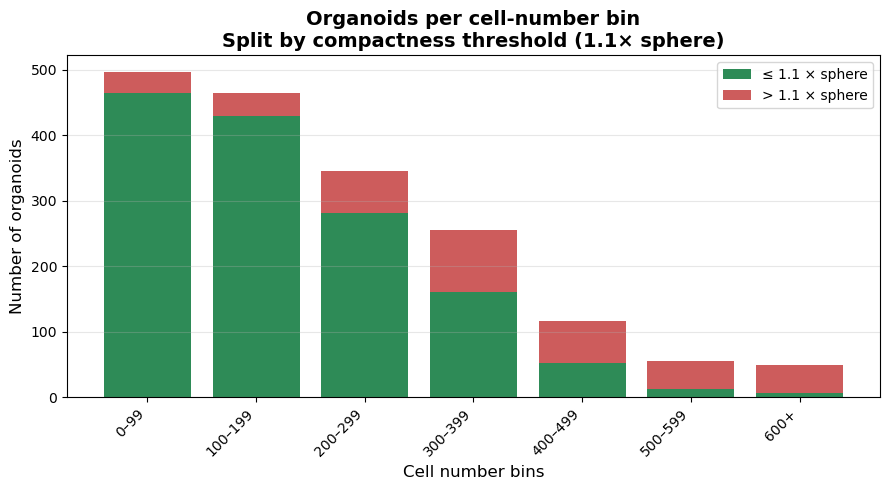

In [232]:
import numpy as np
import matplotlib.pyplot as plt

# Threshold for compactness relative to sphere
threshold = 1.1
comp_sphere = 4.835

# Initialize counts per bin
below_counts = []
above_counts = []
total_counts = []

for label in bin_labels:
    entries = binned_organoids_by_cellnum[label]
    n_total = len(entries)
    total_counts.append(n_total)
    if n_total == 0:
        below_counts.append(0)
        above_counts.append(0)
        continue

    compactness_vals = []
    for tp, org_idx in entries:
        area = results[tp]['total_area'][org_idx]
        volume = results[tp]['total_volume'][org_idx]
        comp = area / (volume ** (2.0 / 3.0)) / comp_sphere
        compactness_vals.append(comp)

    compactness_vals = np.array(compactness_vals)
    n_below = np.sum(compactness_vals <= threshold)
    n_above = np.sum(compactness_vals > threshold)

    below_counts.append(n_below)
    above_counts.append(n_above)

# Convert to arrays for plotting
below_counts = np.array(below_counts)
above_counts = np.array(above_counts)
total_counts = np.array(total_counts)

# -----------------------------------------------------------------
# Stacked bar plot (absolute counts, split by threshold)
# -----------------------------------------------------------------
plt.figure(figsize=(9, 5))

bar_width = 0.8
x = np.arange(len(bin_labels))

plt.bar(x, below_counts, width=bar_width, color='seagreen', label=f"≤ {threshold:.1f} × sphere")
plt.bar(x, above_counts, width=bar_width, bottom=below_counts, color='indianred', label=f"> {threshold:.1f} × sphere")

plt.xticks(x, bin_labels, rotation=45, ha='right')
plt.ylabel("Number of organoids", fontsize=12)
plt.xlabel("Cell number bins", fontsize=12)
plt.title(f"Organoids per cell-number bin\nSplit by compactness threshold ({threshold:.1f}× sphere)", fontsize=14, fontweight='bold')
plt.legend()
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()


/tmp/ipykernel_3417093/980038680.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_time = get_cmap('tab10')  # timepoints (categorical)
/tmp/ipykernel_3417093/980038680.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bins = get_cmap('viridis')  # cell-number bins (ordered)


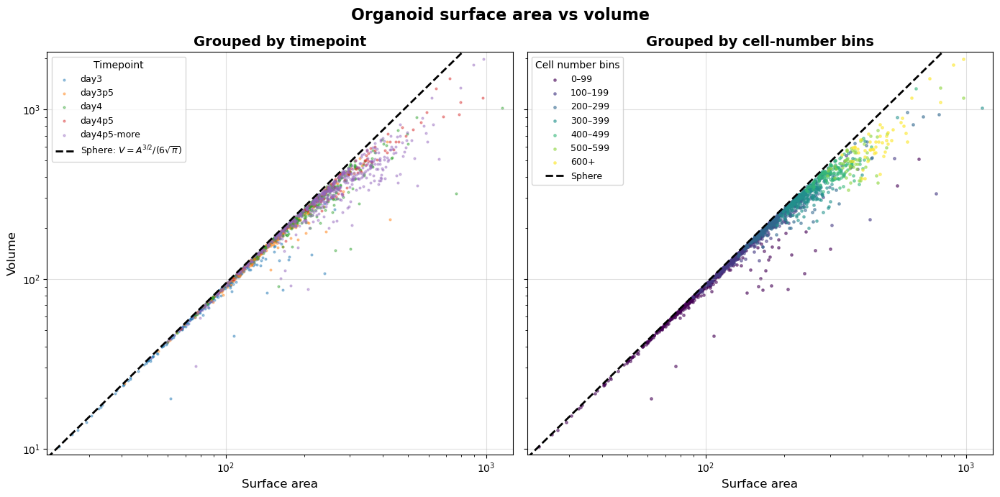

In [233]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.cm import get_cmap

# --- Prepare color maps ---
cmap_time = get_cmap('tab10')  # timepoints (categorical)
colors_time = {tp: cmap_time(i % 10) for i, tp in enumerate(timepoints)}

cmap_bins = get_cmap('viridis')  # cell-number bins (ordered)
colors_bins = {label: cmap_bins(i / max(1, len(bin_labels)-1)) for i, label in enumerate(bin_labels)}

# --- Create figure with 2 subplots ---
fig, axes = plt.subplots(1, 2, figsize=(14, 7), sharex=True, sharey=True)

# =====================================================
# 1️⃣ Left subplot — grouped by timepoint
# =====================================================
ax = axes[0]
for tp in timepoints:
    res = results[tp]
    areas = res['total_area']
    volumes = res['total_volume']
    ax.scatter(
        areas, volumes,
        color=colors_time[tp],
        alpha=0.4,
        label=tp,
        s=4,
    )

# --- Reference sphere curve ---
all_areas = np.concatenate([results[tp]['total_area'] for tp in timepoints])
all_volumes = np.concatenate([results[tp]['total_volume'] for tp in timepoints])
A_range = np.linspace(all_areas.min() * 0.9, all_areas.max() * 1.1, 200)
V_sphere = (1.0 / (6.0 * np.sqrt(np.pi))) * (A_range**1.5)
ax.plot(A_range, V_sphere, 'k--', lw=2, label=r"Sphere: $V = A^{3/2} / (6\sqrt{\pi})$")

ax.set_xlabel("Surface area", fontsize=12)
ax.set_ylabel("Volume", fontsize=12)
ax.set_title("Grouped by timepoint", fontsize=14, fontweight='bold')
ax.legend(title="Timepoint", fontsize=9)
ax.grid(True, alpha=0.4)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(all_areas.min() * 0.9, all_areas.max() * 1.1)
ax.set_ylim(all_volumes.min() * 0.9, all_volumes.max() * 1.1)

# =====================================================
# 2️⃣ Right subplot — grouped by cell-number bins
# =====================================================
ax = axes[1]
for label in bin_labels:
    entries = binned_organoids_by_cellnum[label]
    if len(entries) == 0:
        continue

    # Collect areas and volumes for all organoids in this bin (across timepoints)
    areas_bin = []
    volumes_bin = []
    for tp, org_idx in entries:
        areas_bin.append(results[tp]['total_area'][org_idx])
        volumes_bin.append(results[tp]['total_volume'][org_idx])
    areas_bin = np.array(areas_bin)
    volumes_bin = np.array(volumes_bin)

    ax.scatter(
        areas_bin, volumes_bin,
        color=colors_bins[label],
        alpha=0.5,
        s=6,
        label=label
    )

# Sphere curve again for reference
ax.plot(A_range, V_sphere, 'k--', lw=2, label=r"Sphere")

ax.set_xlabel("Surface area", fontsize=12)
ax.set_title("Grouped by cell-number bins", fontsize=14, fontweight='bold')
ax.legend(title="Cell number bins", fontsize=9)
ax.grid(True, alpha=0.4)
ax.set_xscale('log')
ax.set_yscale('log')

# =====================================================
# Final adjustments
# =====================================================
fig.suptitle("Organoid surface area vs volume", fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


/tmp/ipykernel_3417093/2689629325.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_time = get_cmap('tab10')  # for timepoints
/tmp/ipykernel_3417093/2689629325.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bins = get_cmap('viridis')  # for cell-number bins


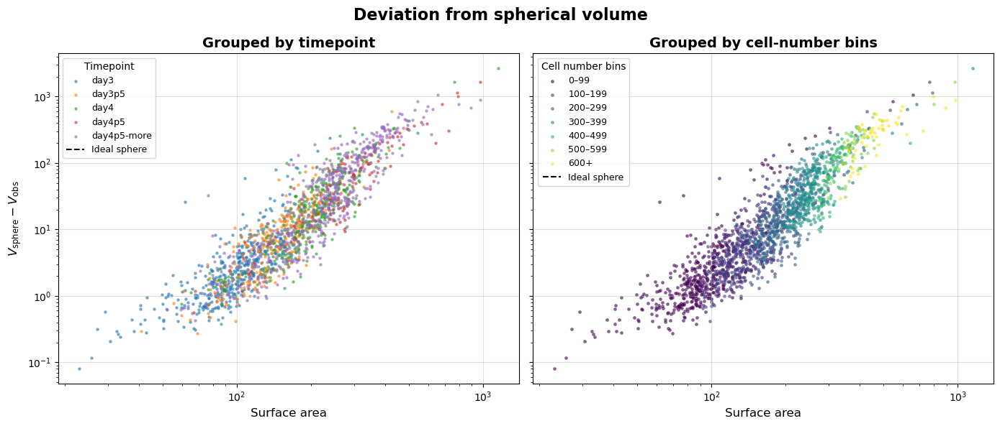

In [234]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.cm import get_cmap

# --- Prepare color maps ---
cmap_time = get_cmap('tab10')  # for timepoints
colors_time = {tp: cmap_time(i % 10) for i, tp in enumerate(timepoints)}

cmap_bins = get_cmap('viridis')  # for cell-number bins
colors_bins = {label: cmap_bins(i / max(1, len(bin_labels)-1)) for i, label in enumerate(bin_labels)}

# --- Create figure with 2 subplots ---
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# =====================================================
# 1️⃣ Left subplot — grouped by timepoint
# =====================================================
ax = axes[0]
for tp in timepoints:
    res = results[tp]
    areas = res['total_area']
    volumes = res['total_volume']

    # Ideal sphere volume
    V_sphere = (1.0 / (6.0 * np.sqrt(np.pi))) * (areas**1.5)
    deviation = V_sphere - volumes

    ax.scatter(
        areas,
        deviation,
        color=colors_time[tp],
        alpha=0.5,
        label=tp,
        s=5,
    )

ax.axhline(0, color='k', linestyle='--', lw=1.5, label="Ideal sphere")
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel("Surface area", fontsize=12)
ax.set_ylabel(r"$V_{\mathrm{sphere}} - V_{\mathrm{obs}} $", fontsize=12)
ax.set_title("Grouped by timepoint", fontsize=14, fontweight='bold')
ax.legend(title="Timepoint", fontsize=9)
ax.grid(True, alpha=0.4)

# =====================================================
# 2️⃣ Right subplot — grouped by cell-number bins
# =====================================================
ax = axes[1]
for label in bin_labels:
    entries = binned_organoids_by_cellnum[label]
    if len(entries) == 0:
        continue

    areas_bin = []
    deviation_bin = []
    for tp, org_idx in entries:
        areas_org = results[tp]['total_area'][org_idx]
        volumes_org = results[tp]['total_volume'][org_idx]
        V_sphere_org = (1.0 / (6.0 * np.sqrt(np.pi))) * (areas_org**1.5)
        areas_bin.append(areas_org)
        deviation_bin.append(V_sphere_org - volumes_org)

    ax.scatter(
        areas_bin,
        deviation_bin,
        color=colors_bins[label],
        alpha=0.5,
        s=6,
        label=label
    )

ax.axhline(0, color='k', linestyle='--', lw=1.5, label="Ideal sphere")
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel("Surface area", fontsize=12)
ax.set_title("Grouped by cell-number bins", fontsize=14, fontweight='bold')
ax.legend(title="Cell number bins", fontsize=9)
ax.grid(True, alpha=0.4)

# =====================================================
# Final formatting
# =====================================================
fig.suptitle("Deviation from spherical volume", fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


Skipping tp=day4p5-more, org_idx=533 (out of bounds for 533)


/tmp/ipykernel_3417093/337902686.py:6: RuntimeWarning: Mean of empty slice
  mean_C = np.nanmean(res["Corr_conn_all"], axis=0)   # (B,F,F)
/tmp/ipykernel_3417093/337902686.py:35: RuntimeWarning: Mean of empty slice
  mean_corr = np.nanmean(corr_values, axis=0)


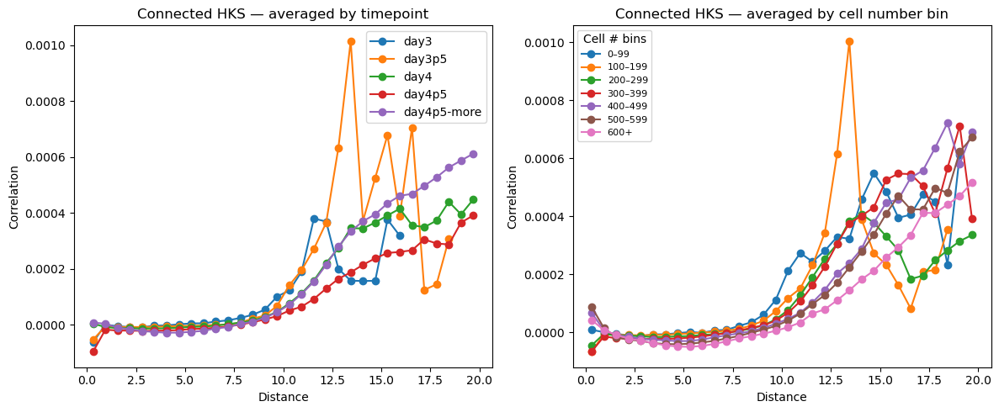

In [235]:
plt.figure(figsize=(12, 5))

# --- Left: Connected correlation averaged over timepoints ---
plt.subplot(1, 2, 1)
for tp, res in results.items():
    mean_C = np.nanmean(res["Corr_conn_all"], axis=0)   # (B,F,F)
    plt.plot(bin_centers, mean_C[:, 0, 0], 'o-', label=tp)

plt.xlabel("Distance")
plt.ylabel("Correlation")
plt.title("Connected HKS — averaged by timepoint")
plt.legend()

# --- Right: Connected correlation averaged over cell number bins ---
plt.subplot(1, 2, 2)
for bin_label in bin_labels:
    org_refs = binned_organoids_by_cellnum[bin_label]
    if len(org_refs) == 0:
        continue

    corr_values = []
    for tp, org_idx in org_refs:
        Corr_conn = results[tp]['Corr_conn_all']  # (n_org, B, F, F)

        # Defensive check to avoid out-of-bounds
        if org_idx < Corr_conn.shape[0]:
            corr_values.append(Corr_conn[org_idx, :, 0, 0])
        else:
            print(f"Skipping tp={tp}, org_idx={org_idx} (out of bounds for {Corr_conn.shape[0]})")

    if len(corr_values) == 0:
        continue

    corr_values = np.vstack(corr_values)
    mean_corr = np.nanmean(corr_values, axis=0)

    plt.plot(bin_centers, mean_corr, 'o-', label=bin_label)

plt.xlabel("Distance")
plt.ylabel("Correlation")
plt.title("Connected HKS — averaged by cell number bin")
plt.legend(title="Cell # bins", fontsize=8)
plt.tight_layout()



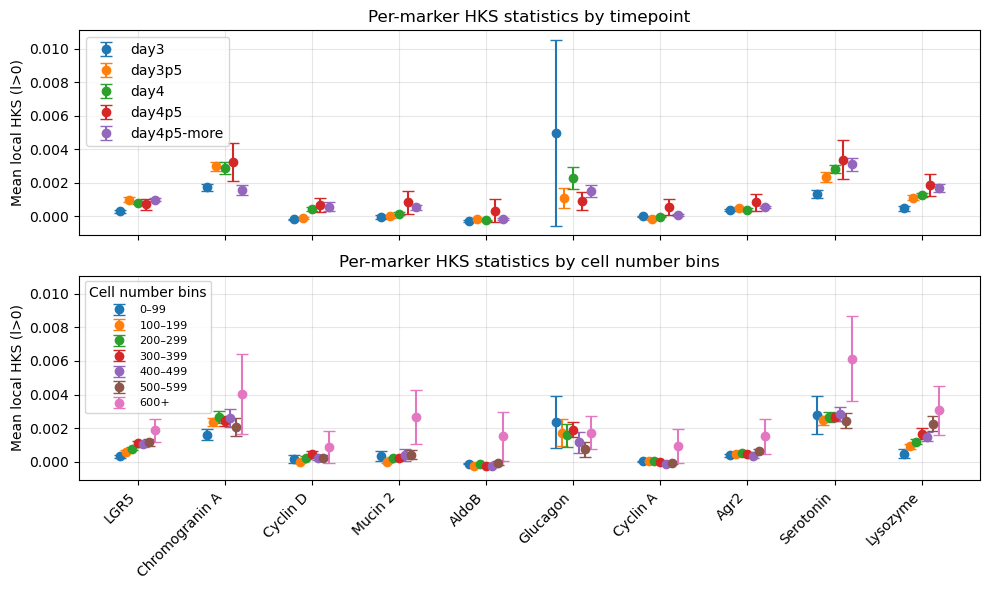

In [236]:
import numpy as np
import matplotlib.pyplot as plt

# --- Helper ---
def to_2d_markers(arr):
    a = np.asarray(arr)
    if a.ndim == 3 and a.shape[-1] == 1:
        a = a[..., 0]
    elif a.ndim == 1:
        a = a[None, :]
    elif a.ndim != 2:
        raise ValueError(f"Expected 2D or 3D with last dim=1; got shape {a.shape}")
    return a

def mean_sem(arr2d):
    A = np.asarray(arr2d)
    means  = np.nanmean(A, axis=0)
    counts = np.sum(~np.isnan(A), axis=0)
    stds   = np.nanstd(A, axis=0, ddof=1)
    sems   = np.where(counts > 1, stds / np.sqrt(counts), np.nan)
    return means, sems

# x-locations for markers
x = np.arange(len(marker_names))
offset_width = 0.2   # horizontal spread

# ---------- 1) Plot by timepoint ----------
fig, axes = plt.subplots(2, 1, figsize=(10, 6), sharex=True, sharey=True)
ax1 = axes[0]

n_tp = len(timepoints)
# symmetric offsets around 0 for each timepoint
time_offsets = np.linspace(-offset_width, offset_width, n_tp)

for t_idx, tp in enumerate(timepoints):
    res = results[tp]
    hks_means = to_2d_markers(res['hks_cell_mean_all'])
    if hks_means.size == 0:
        continue

    mean_tp, sem_tp = mean_sem(hks_means)
    mean_tp = mean_tp.ravel()
    sem_tp  = sem_tp.ravel()

    if mean_tp.shape[0] != len(x):
        print(f"⚠ Skipping {tp}: mean has shape {mean_tp.shape}, expected {len(x)}")
        continue

    x_positions = x + time_offsets[t_idx]
    ax1.errorbar(
        x_positions, mean_tp, yerr=sem_tp,
        fmt='o', capsize=4, label=tp
    )

ax1.set_ylabel("Mean local HKS (l>0)")
ax1.set_title("Per-marker HKS statistics by timepoint")
ax1.legend()
ax1.grid(alpha=0.3)

# ---------- 2) Plot by cell-number bins ----------
ax2 = axes[1]

n_bins = len(bin_labels)
bin_offsets = np.linspace(-offset_width, offset_width, n_bins)

for b_idx, bin_label in enumerate(bin_labels):
    org_refs = binned_organoids_by_cellnum[bin_label]
    if len(org_refs) == 0:
        continue

    bin_rows = []
    for tp, org_idx in org_refs:
        hks_all_tp = to_2d_markers(results[tp]['hks_cell_mean_all'])
        if 0 <= org_idx < hks_all_tp.shape[0]:
            bin_rows.append(hks_all_tp[org_idx, :])

    if len(bin_rows) == 0:
        continue

    bin_data = np.vstack(bin_rows)
    mean_bin, sem_bin = mean_sem(bin_data)
    mean_bin = mean_bin.ravel()
    sem_bin  = sem_bin.ravel()

    if mean_bin.shape[0] != len(x):
        print(f"⚠ Skipping bin {bin_label}: mean has shape {mean_bin.shape}, expected {len(x)}")
        continue

    x_positions = x + bin_offsets[b_idx]
    ax2.errorbar(
        x_positions, mean_bin, yerr=sem_bin,
        fmt='o', capsize=4, label=bin_label
    )

ax2.set_xticks(x)
ax2.set_xticklabels(marker_names, rotation=45, ha='right')
ax2.set_ylabel("Mean local HKS (l>0)")
ax2.set_title("Per-marker HKS statistics by cell number bins")
ax2.legend(title="Cell number bins", fontsize=8)
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()


/tmp/ipykernel_3417093/3914660346.py:7: RuntimeWarning: Mean of empty slice
  mean_profiles = np.nanmean(arr, axis=0)
/home/fmoller/miniforge3/envs/SphericalHarmonics/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


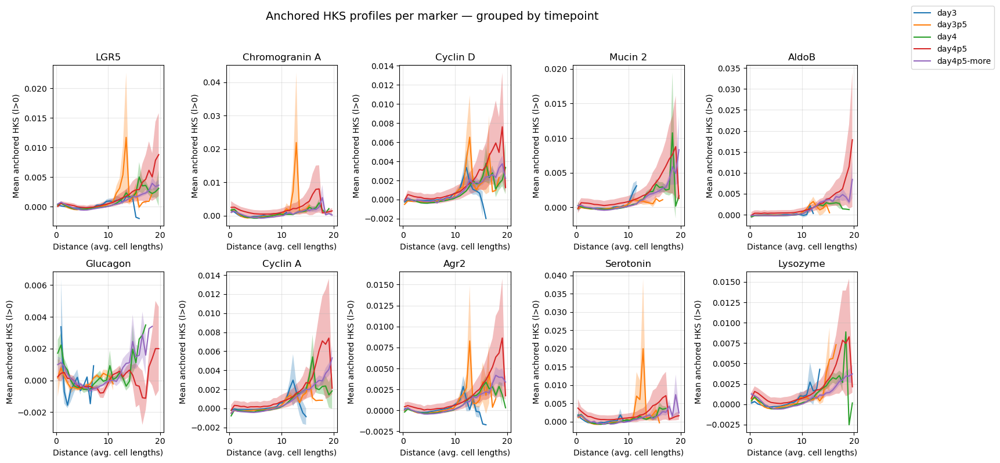

/tmp/ipykernel_3417093/3914660346.py:104: RuntimeWarning: Mean of empty slice
  mean_bin = np.nanmean(bin_profiles, axis=0)


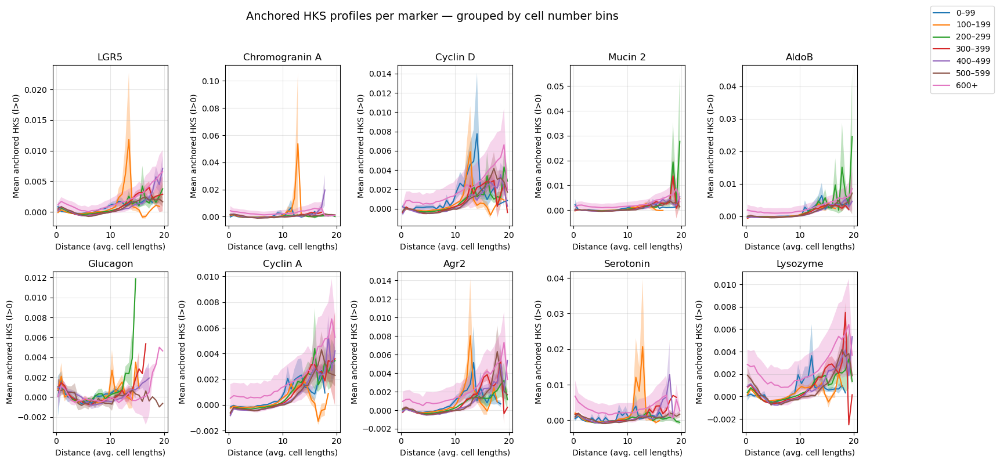

In [237]:
import numpy as np
import matplotlib.pyplot as plt

# --- Helper ---
def mean_sem_profiles(arr):
    """Compute mean and SEM across axis=0 for (n_org, n_markers, nbins)."""
    mean_profiles = np.nanmean(arr, axis=0)
    counts = np.sum(~np.isnan(arr), axis=0)
    std_profiles = np.nanstd(arr, axis=0, ddof=1)
    sem_profiles = np.where(counts > 1, std_profiles / np.sqrt(counts), np.nan)
    return mean_profiles, sem_profiles


# Determine number of markers and bins
sample_tp = next(iter(results))
num_markers = results[sample_tp]['hks_profile_all'].shape[1]
nbins = results[sample_tp]['hks_profile_all'].shape[2]

# ------------------------------
# 1. Plot by TIMEPOINT
# ------------------------------
fig, axes = plt.subplots(
    2, int(np.ceil(num_markers / 2)),
    figsize=(3 * int(np.ceil(num_markers / 2)), 8),
    sharex=False, sharey=False
)
axes = axes.ravel()

# Keep track of legend handles to avoid duplicates
legend_handles = []
legend_labels = []

for m_idx in range(num_markers):
    ax = axes[m_idx]

    for tp in timepoints:
        profiles_tp = results[tp]['hks_profile_all']
        if profiles_tp.size == 0:
            continue

        mean_tp, sem_tp = mean_sem_profiles(profiles_tp)
        mean_tp_m = mean_tp[m_idx]
        sem_tp_m = sem_tp[m_idx]

        line, = ax.plot(bin_centers, mean_tp_m, '-', label=tp)
        ax.fill_between(
            bin_centers,
            mean_tp_m - sem_tp_m,
            mean_tp_m + sem_tp_m,
            alpha=0.3
        )

        # Add legend handle only once per tp
        if tp not in legend_labels:
            legend_handles.append(line)
            legend_labels.append(tp)

    ax.set_title(marker_names[m_idx])
    ax.set_xlabel("Distance (avg. cell lengths)")
    ax.set_ylabel("Mean anchored HKS (l>0)")
    ax.grid(True, alpha=0.3)

# Remove unused subplots if needed
for ax in axes[num_markers:]:
    ax.axis('off')

fig.suptitle("Anchored HKS profiles per marker — grouped by timepoint", fontsize=14)
fig.legend(legend_handles, legend_labels, loc="upper right", bbox_to_anchor=(1.15, 1))
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


# ------------------------------
# 2. Plot by CELL NUMBER BIN
# ------------------------------
fig, axes = plt.subplots(
    2, int(np.ceil(num_markers / 2)),
    figsize=(3 * int(np.ceil(num_markers / 2)), 8),
    sharex=False, sharey=False
)
axes = axes.ravel()

legend_handles = []
legend_labels = []

for m_idx in range(num_markers):
    ax = axes[m_idx]

    for bin_label in bin_labels:
        org_refs = binned_organoids_by_cellnum[bin_label]
        if len(org_refs) == 0:
            continue

        bin_profiles = []
        for tp, org_idx in org_refs:
            profiles_tp = results[tp]['hks_profile_all']
            if org_idx < profiles_tp.shape[0]:
                bin_profiles.append(profiles_tp[org_idx, m_idx, :])

        if len(bin_profiles) == 0:
            continue

        bin_profiles = np.vstack(bin_profiles)
        mean_bin = np.nanmean(bin_profiles, axis=0)
        sem_bin = np.nanstd(bin_profiles, axis=0, ddof=1) / np.sqrt(np.sum(~np.isnan(bin_profiles), axis=0))

        line, = ax.plot(bin_centers, mean_bin, '-', label=bin_label)
        ax.fill_between(
            bin_centers,
            mean_bin - sem_bin,
            mean_bin + sem_bin,
            alpha=0.3
        )

        if bin_label not in legend_labels:
            legend_handles.append(line)
            legend_labels.append(bin_label)

    ax.set_title(marker_names[m_idx])
    ax.set_xlabel("Distance (avg. cell lengths)")
    ax.set_ylabel("Mean anchored HKS (l>0)")
    ax.grid(True, alpha=0.3)

for ax in axes[num_markers:]:
    ax.axis('off')

fig.suptitle("Anchored HKS profiles per marker — grouped by cell number bins", fontsize=14)
fig.legend(legend_handles, legend_labels, loc="upper right", bbox_to_anchor=(1.15, 1))
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


/tmp/ipykernel_3417093/1048985118.py:17: RuntimeWarning: Mean of empty slice
  Enrichment_mean = np.nanmean(res["Enrichment_all"][:,i_source,:,j_target], axis=0)


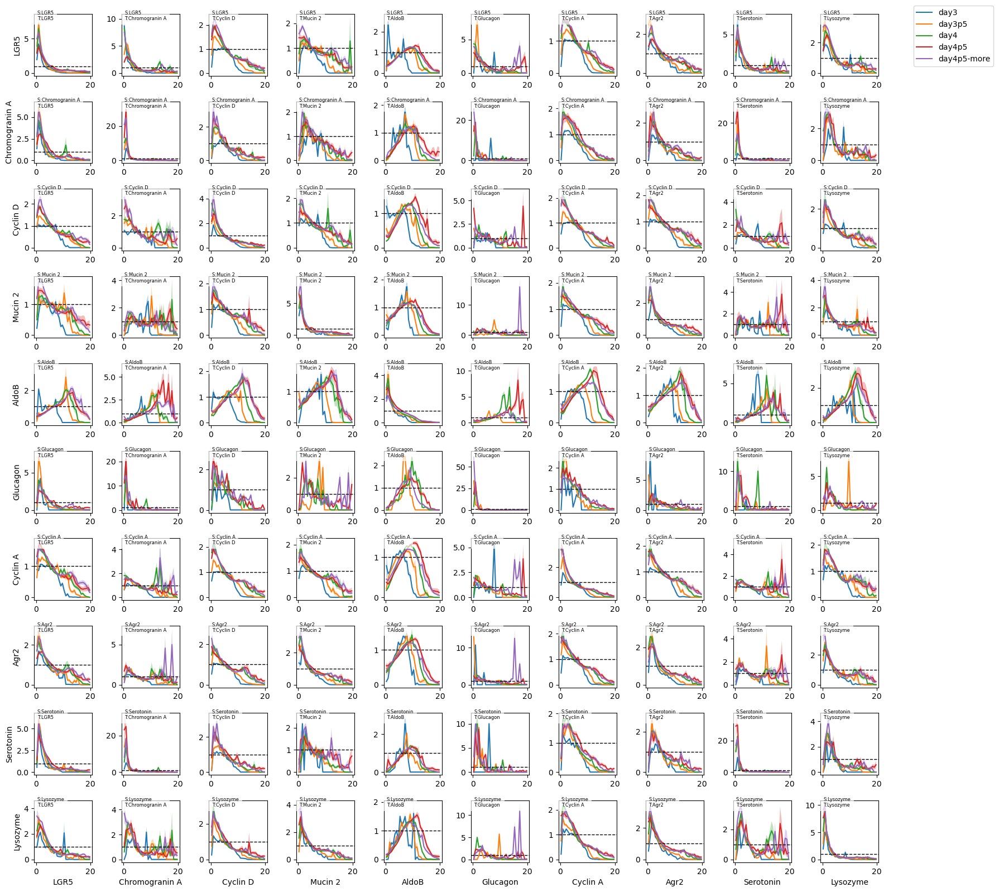

In [238]:
sample_tp = next(iter(results))
_, n_markers, nbins, _ = results[sample_tp]["Enrichment_all"].shape


# -------------------- Plot cross-enrichment grid --------------------
fig, axes = plt.subplots(n_markers, n_markers,
                         figsize=(16, 16),
                         sharex=False, sharey=False)

for i_source in range(n_markers):
    for j_target in range(n_markers):
        ax = axes[i_source, j_target]

        # Plot ensemble-averaged enrichment for each timepoint
        for tp, res in results.items():
            n_organoids = res["Enrichment_all"].shape[0]
            Enrichment_mean = np.nanmean(res["Enrichment_all"][:,i_source,:,j_target], axis=0)  
            Enrichment_std  = np.nanstd(res["Enrichment_all"][:,i_source,:,j_target], axis=0)
            Enrichment_sem  = Enrichment_std / np.sqrt(n_organoids)

            ax.plot(bin_centers, Enrichment_mean, label=tp)
            ax.fill_between(bin_centers,
                            Enrichment_mean - Enrichment_sem,
                            Enrichment_mean + Enrichment_sem,
                            alpha=0.3)

        ax.axhline(1.0, color='k', linestyle='--', linewidth=1)

        # Axis labels
        if i_source == n_markers - 1:
            ax.set_xlabel(f"{marker_names[j_target]}", fontsize=10)
        if j_target == 0:
            ax.set_ylabel(f"{marker_names[i_source]}", fontsize=10)

        ax.tick_params(axis='both', which='major', labelsize=10)

        # Add label inside subplot for quick identification
        ax.text(0.05, 0.9, f"S:{marker_names[i_source]}\nT:{marker_names[j_target]}",
                transform=ax.transAxes, fontsize=6, color='black',
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper right", bbox_to_anchor=(1.12, 1.0))

plt.tight_layout()

/tmp/ipykernel_3417093/4041852930.py:29: RuntimeWarning: Mean of empty slice
  mean_curve = np.nanmean(curves, axis=0)


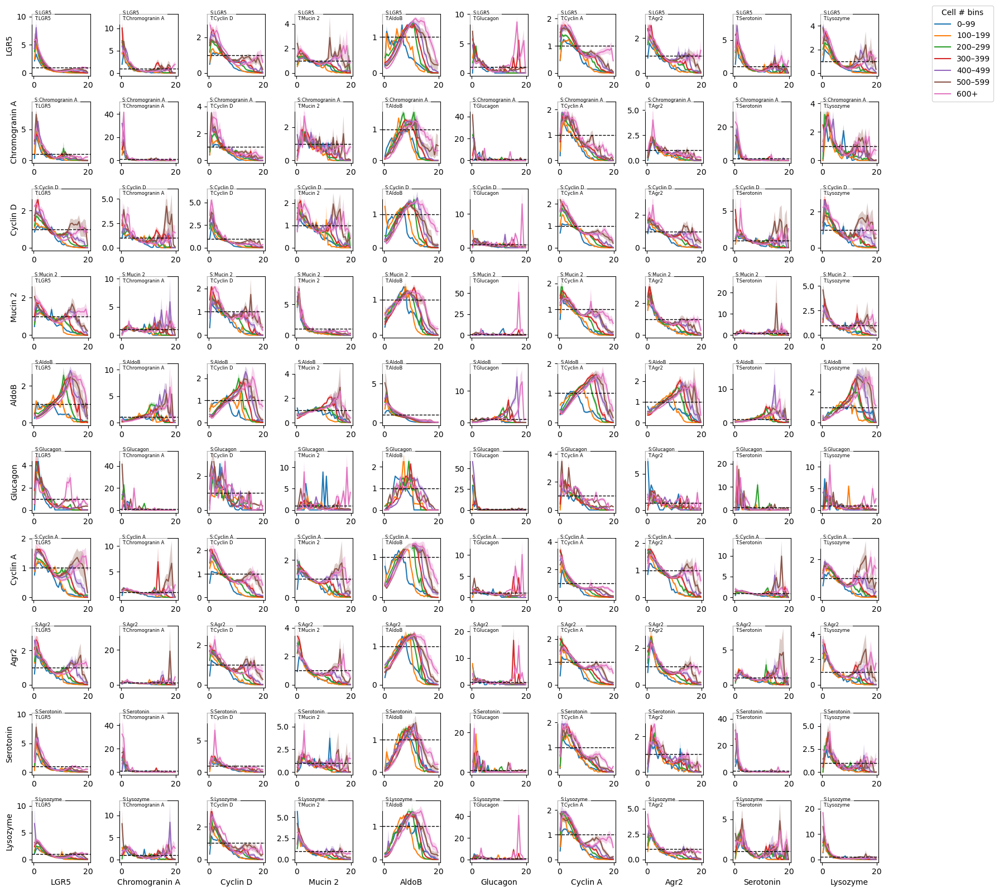

In [239]:
# -------------------- Plot cross-enrichment grid (grouped by cell number bins) --------------------
fig, axes = plt.subplots(n_markers, n_markers,
                         figsize=(16, 16),
                         sharex=False, sharey=False)

for i_source in range(n_markers):
    for j_target in range(n_markers):
        ax = axes[i_source, j_target]

        # Plot ensemble-averaged enrichment for each cell number bin
        for bin_label in bin_labels:
            org_refs = binned_organoids_by_cellnum[bin_label]
            if len(org_refs) == 0:
                continue

            # Collect enrichment curves for all organoids in this bin
            curves = []
            for tp, org_idx in org_refs:
                Enrich = results[tp]["Enrichment_all"]  # (n_org, M, B, M)
                if org_idx < Enrich.shape[0]:
                    curves.append(Enrich[org_idx, i_source, :, j_target])
                # else:
                    # print(f"Skipping tp={tp}, org_idx={org_idx} (out of bounds for {Enrich.shape[0]})")

            if len(curves) == 0:
                continue

            curves = np.vstack(curves)
            mean_curve = np.nanmean(curves, axis=0)
            std_curve = np.nanstd(curves, axis=0)
            sem_curve = std_curve / np.sqrt(curves.shape[0])

            ax.plot(bin_centers, mean_curve, label=bin_label)
            ax.fill_between(
                bin_centers,
                mean_curve - sem_curve,
                mean_curve + sem_curve,
                alpha=0.3
            )

        ax.axhline(1.0, color='k', linestyle='--', linewidth=1)

        # Axis labels
        if i_source == n_markers - 1:
            ax.set_xlabel(f"{marker_names[j_target]}", fontsize=10)
        if j_target == 0:
            ax.set_ylabel(f"{marker_names[i_source]}", fontsize=10)

        ax.tick_params(axis='both', which='major', labelsize=10)

        # Add label inside subplot for quick identification
        ax.text(0.05, 0.9, f"S:{marker_names[i_source]}\nT:{marker_names[j_target]}",
                transform=ax.transAxes, fontsize=6, color='black',
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

# Shared legend for cell number bins
handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper right", bbox_to_anchor=(1.12, 1.0), title="Cell # bins")

plt.tight_layout()


In [240]:
for tp in timepoints:
    res = results[tp]
    global_I_array = res["global_I_ensemble"]
    global_perm_array = res["global_perm_ensemble"]
    print(f"\n{tp}:")
    print("  NaN fraction in global_I_array:", np.isnan(global_I_array).mean())
    print("  NaN fraction in global_perm_array:", np.isnan(global_perm_array).mean())
    print("  Any finite values?", np.any(np.isfinite(global_I_array)))



day3:
  NaN fraction in global_I_array: 0.610593220338983
  NaN fraction in global_perm_array: 0.610593220338983
  Any finite values? True

day3p5:
  NaN fraction in global_I_array: 0.47628205128205126
  NaN fraction in global_perm_array: 0.47628205128205126
  Any finite values? True

day4:
  NaN fraction in global_I_array: 0.36358543417366945
  NaN fraction in global_perm_array: 0.36358543417366945
  Any finite values? True

day4p5:
  NaN fraction in global_I_array: 0.24587155963302754
  NaN fraction in global_perm_array: 0.24587155963302754
  Any finite values? True

day4p5-more:
  NaN fraction in global_I_array: 0.4350844277673546
  NaN fraction in global_perm_array: 0.4350844277673546
  Any finite values? True


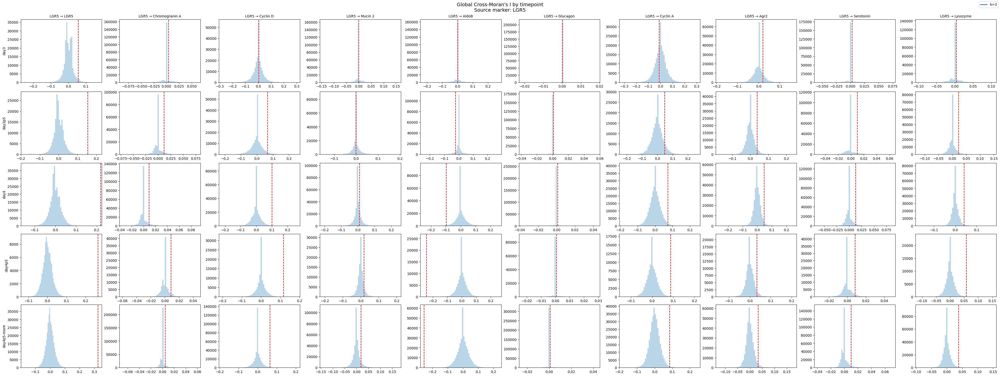

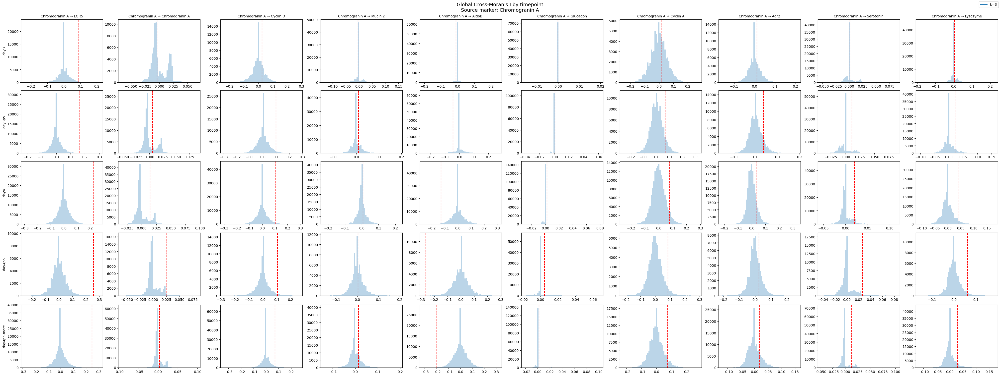

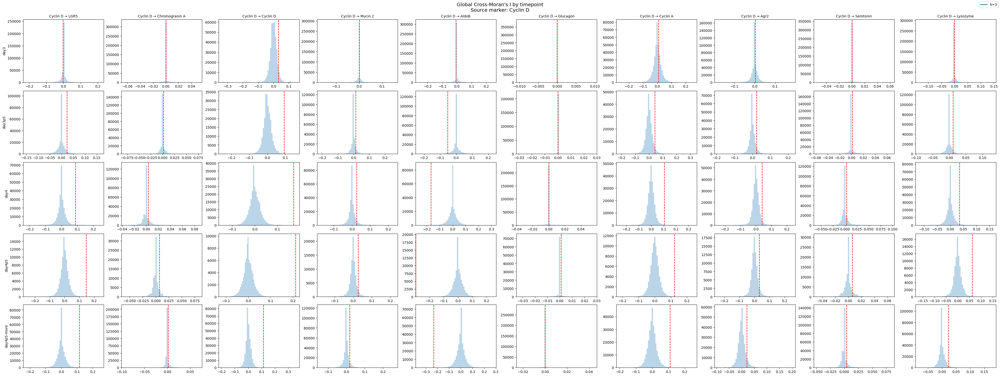

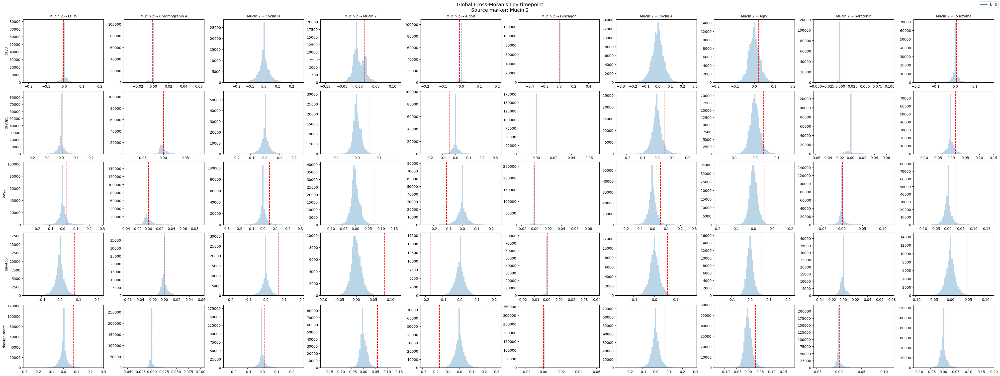

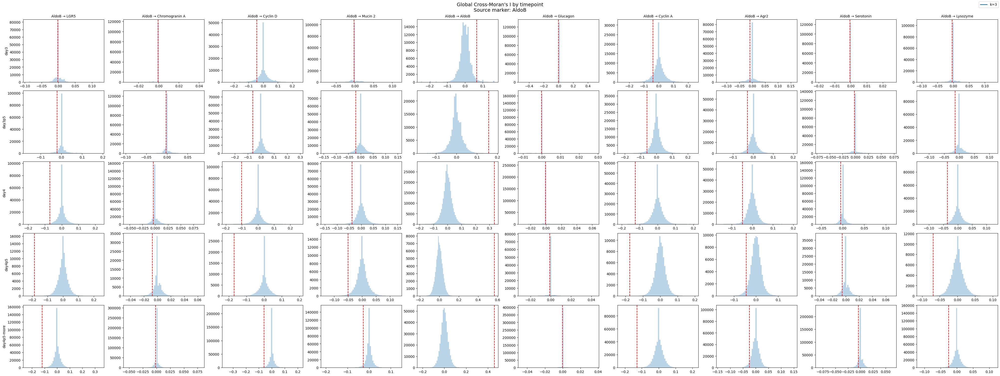

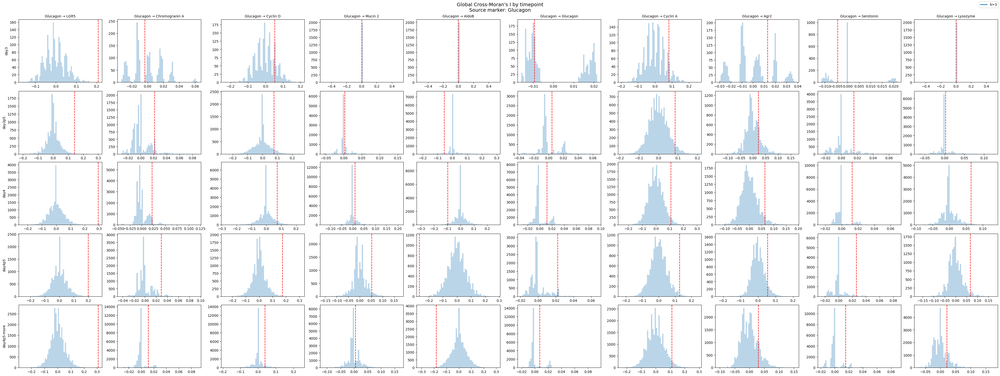

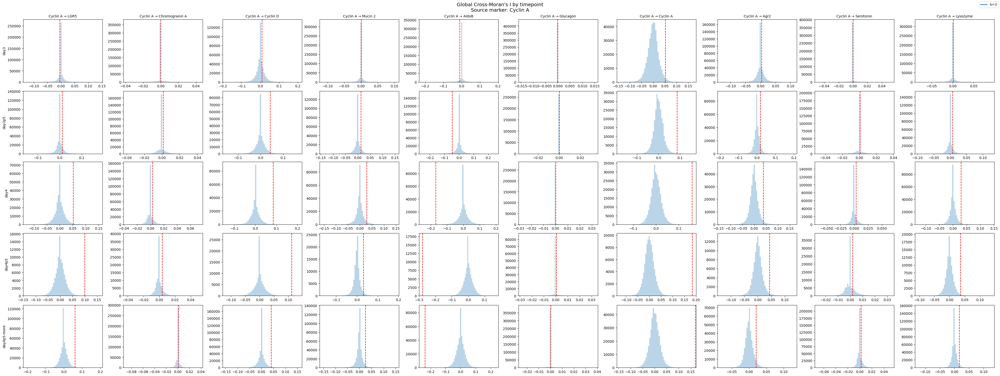

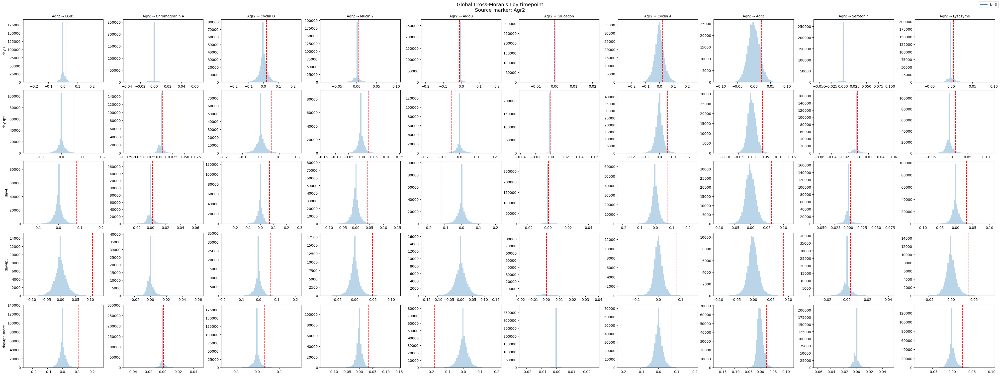

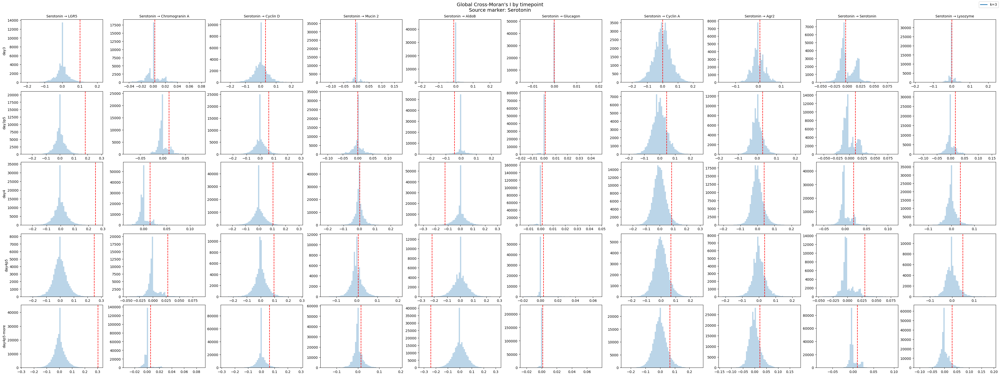

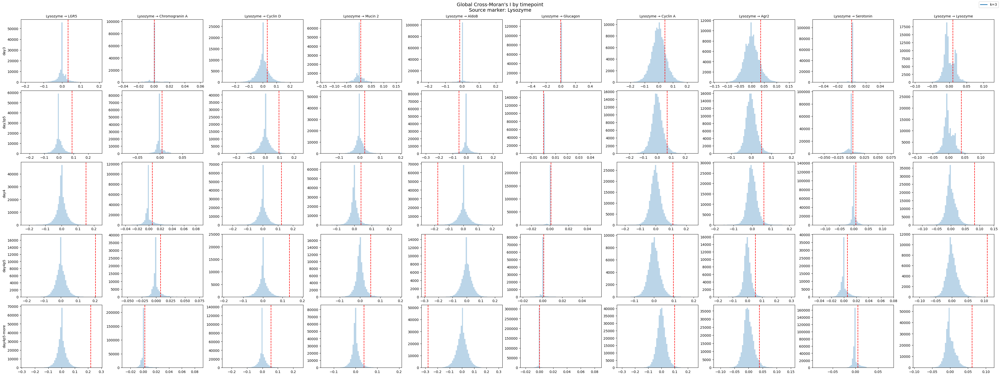

In [241]:
# --- Parameters ---
color_k = "tab:blue"   # since we're using a single k_value now

for i_source in range(n_markers):
    fig, axes = plt.subplots(
        len(timepoints), n_markers,
        figsize=(4 * n_markers, 3 * len(timepoints)),
        sharex=False, sharey=False,
        constrained_layout=True
    )

    # Ensure axes is always 2D
    if len(timepoints) == 1:
        axes = np.expand_dims(axes, 0)

    for t_idx, tp in enumerate(timepoints):
        res = results[tp]
        global_I_array = res["global_I_ensemble"]          # (n_org, M, M)
        global_perm_array = res["global_perm_ensemble"]    # (n_org, n_perms, M, M)

        # If there's no data for this timepoint, skip
        if global_I_array.size == 0:
            continue

        for j_target in range(n_markers):
            ax = axes[t_idx, j_target]

            # Extract all observed Moran's I values across organoids for this marker pair
            obs_all = global_I_array[:, i_source, j_target]
            obs_mean = np.nanmean(obs_all)

            # Flatten all permutation samples across organoids
            perm_all = global_perm_array[:, :, i_source, j_target].ravel()
            perm_data = perm_all[~np.isnan(perm_all)]

            if len(perm_data) > 0:
                ax.hist(perm_data, bins=60, color=color_k, alpha=0.3)
                ax.axvline(obs_mean, color='red', linestyle="--", label="Observed mean")

            if t_idx == 0:
                ax.set_title(f"{marker_names[i_source]} → {marker_names[j_target]}", fontsize=10)
            if j_target == 0:
                ax.set_ylabel(f"{tp}", fontsize=10)

    fig.suptitle(
        f"Global Cross-Moran's I by timepoint\nSource marker: {marker_names[i_source]}",
        fontsize=14
    )

    handles = [plt.Line2D([0], [0], color=color_k, lw=2)]
    labels = [f"k={k_value}"]
    fig.legend(handles, labels, loc="upper right")

    plt.show()


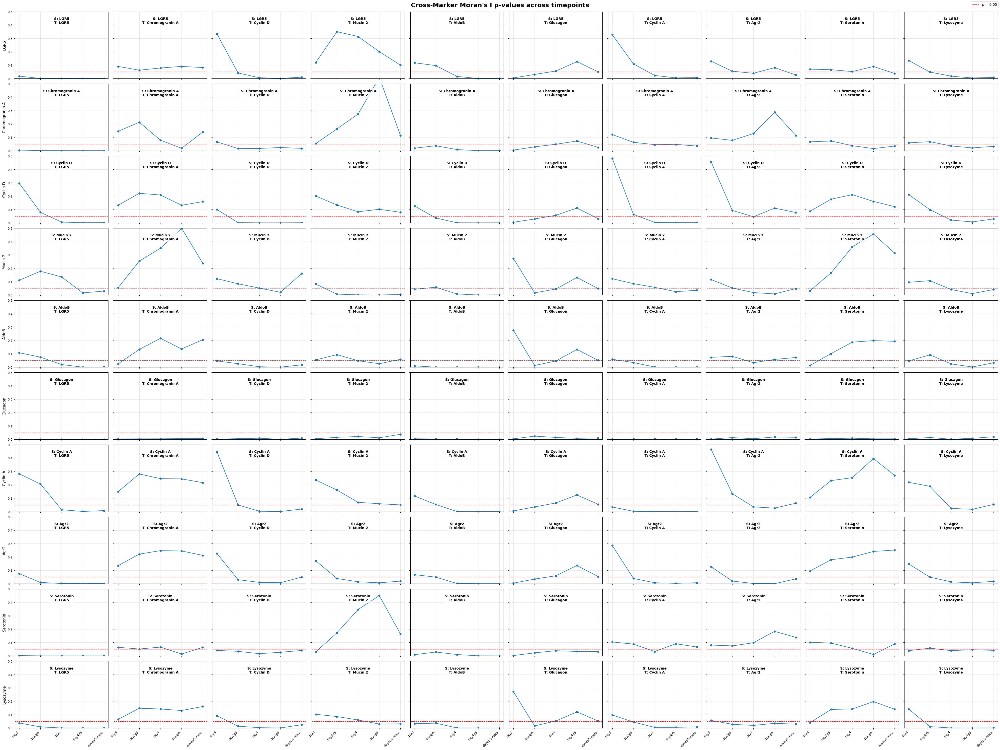

In [242]:
import matplotlib.pyplot as plt
import numpy as np

# --- Parameters ---
n_timepoints = len(timepoints)
time_labels = timepoints  # already sorted list of strings
x = np.arange(n_timepoints)  # numeric positions for plotting

fig, axes = plt.subplots(
    n_markers, n_markers,
    figsize=(4 * n_markers, 3 * n_markers),
    sharex=True, sharey=True,
    constrained_layout=True
)

if n_markers == 1:
    axes = np.array([[axes]])  # ensure 2D array if single marker

for i_source in range(n_markers):
    for j_target in range(n_markers):
        ax = axes[i_source, j_target]

        # Collect p-values across timepoints for this marker pair
        pvals_ij = []
        for tp in timepoints:
            p_matrix = results[tp]['ensemble_p_values']  # (M, M)
            pvals_ij.append(p_matrix[i_source, j_target])
        pvals_ij = np.array(pvals_ij, dtype=float)

        # Plot p-values as a line + scatter
        ax.plot(time_labels, pvals_ij, '-o', color='tab:blue', markersize=5)
        ax.axhline(0.05, color='red', linestyle='--', linewidth=1)

        # Label inside subplot
        ax.text(
            0.5, 0.92,
            f"S: {marker_names[i_source]}\nT: {marker_names[j_target]}",
            transform=ax.transAxes,
            ha='center', va='top',
            fontsize=10, fontweight='bold',
            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.3')
        )

        # Formatting
        if i_source == n_markers - 1:
            ax.set_xticks(x)
            ax.set_xticklabels(time_labels, rotation=45, ha='right', fontsize=10)
        else:
            ax.set_xticks(x)
            ax.set_xticklabels([])

        if j_target == 0:
            ax.set_ylabel(f"{marker_names[i_source]}", fontsize=11)

        ax.set_ylim(0, 0.5)
        ax.tick_params(axis='both', labelsize=9)
        ax.grid(alpha=0.3)

# Shared title
fig.suptitle("Cross-Marker Moran's I p-values across timepoints", fontsize=18, fontweight='bold')

# Add single legend for significance line
handles = [plt.Line2D([0], [0], color='red', linestyle='--', lw=1, label='p = 0.05')]
fig.legend(handles=handles, loc='upper right')

plt.show()


/tmp/ipykernel_3417093/2862255461.py:17: RuntimeWarning: Mean of empty slice
  means  = np.nanmean(A, axis=0)
/home/fmoller/miniforge3/envs/SphericalHarmonics/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


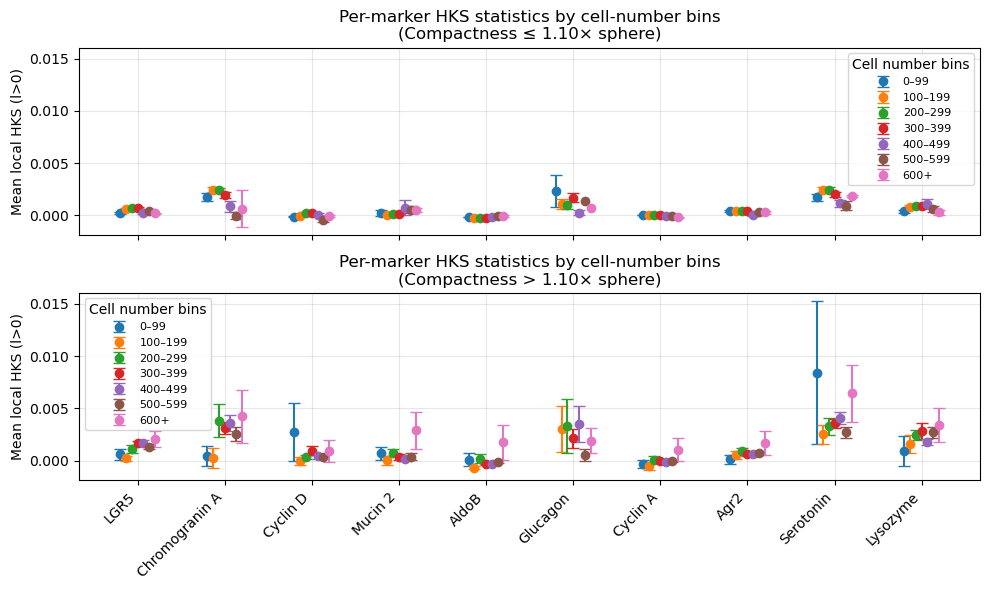

In [243]:
import numpy as np
import matplotlib.pyplot as plt

# --- Helper functions ---
def to_2d_markers(arr):
    a = np.asarray(arr)
    if a.ndim == 3 and a.shape[-1] == 1:
        a = a[..., 0]
    elif a.ndim == 1:
        a = a[None, :]
    elif a.ndim != 2:
        raise ValueError(f"Expected 2D or 3D with last dim=1; got shape {a.shape}")
    return a

def mean_sem(arr2d):
    A = np.asarray(arr2d)
    means  = np.nanmean(A, axis=0)
    counts = np.sum(~np.isnan(A), axis=0)
    stds   = np.nanstd(A, axis=0, ddof=1)
    sems   = np.where(counts > 1, stds / np.sqrt(counts), np.nan)
    return means, sems

# --- Parameters ---
x = np.arange(len(marker_names))
offset_width = 0.2
compactness_threshold = 1.1

# --- Figure with 2 subplots ---
fig, axes = plt.subplots(2, 1, figsize=(10, 6), sharex=True, sharey=True)
ax_below = axes[0]
ax_above = axes[1]

n_bins = len(bin_labels)
bin_offsets = np.linspace(-offset_width, offset_width, n_bins)

# --- Loop over bins ---
for b_idx, bin_label in enumerate(bin_labels):
    org_refs = binned_organoids_by_cellnum[bin_label]
    if len(org_refs) == 0:
        continue

    # Split bin entries into below / above compactness threshold
    below_rows = []
    above_rows = []

    for tp, org_idx in org_refs:
        areas_org = results[tp]['total_area'][org_idx]
        volumes_org = results[tp]['total_volume'][org_idx]
        comp_org = areas_org / (volumes_org ** (2.0 / 3.0)) / comp_sphere

        hks_all_tp = to_2d_markers(results[tp]['hks_cell_mean_all'])
        if not (0 <= org_idx < hks_all_tp.shape[0]):
            continue

        if comp_org <= compactness_threshold:
            below_rows.append(hks_all_tp[org_idx, :])
        else:
            above_rows.append(hks_all_tp[org_idx, :])

    # --- BELOW threshold ---
    if len(below_rows) > 0:
        below_data = np.vstack(below_rows)
        mean_below, sem_below = mean_sem(below_data)
        x_positions = x + bin_offsets[b_idx]
        ax_below.errorbar(
            x_positions, mean_below, yerr=sem_below,
            fmt='o', capsize=4, label=bin_label
        )

    # --- ABOVE threshold ---
    if len(above_rows) > 0:
        above_data = np.vstack(above_rows)
        mean_above, sem_above = mean_sem(above_data)
        x_positions = x + bin_offsets[b_idx]
        ax_above.errorbar(
            x_positions, mean_above, yerr=sem_above,
            fmt='o', capsize=4, label=bin_label
        )

# --- Formatting ---
ax_below.set_ylabel("Mean local HKS (l>0)")
ax_below.set_title(f"Per-marker HKS statistics by cell-number bins\n(Compactness ≤ {compactness_threshold:.2f}× sphere)")
ax_below.legend(title="Cell number bins", fontsize=8)
ax_below.grid(alpha=0.3)

ax_above.set_xticks(x)
ax_above.set_xticklabels(marker_names, rotation=45, ha='right')
ax_above.set_ylabel("Mean local HKS (l>0)")
ax_above.set_title(f"Per-marker HKS statistics by cell-number bins\n(Compactness > {compactness_threshold:.2f}× sphere)")
ax_above.legend(title="Cell number bins", fontsize=8)
ax_above.grid(alpha=0.3)

plt.tight_layout()
plt.show()


/tmp/ipykernel_3417093/613592483.py:50: RuntimeWarning: Mean of empty slice
  mean_below = np.nanmean(below_curves, axis=0)
/home/fmoller/miniforge3/envs/SphericalHarmonics/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/tmp/ipykernel_3417093/613592483.py:59: RuntimeWarning: Mean of empty slice
  mean_above = np.nanmean(above_curves, axis=0)
/tmp/ipykernel_3417093/613592483.py:86: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 1, 0.96])


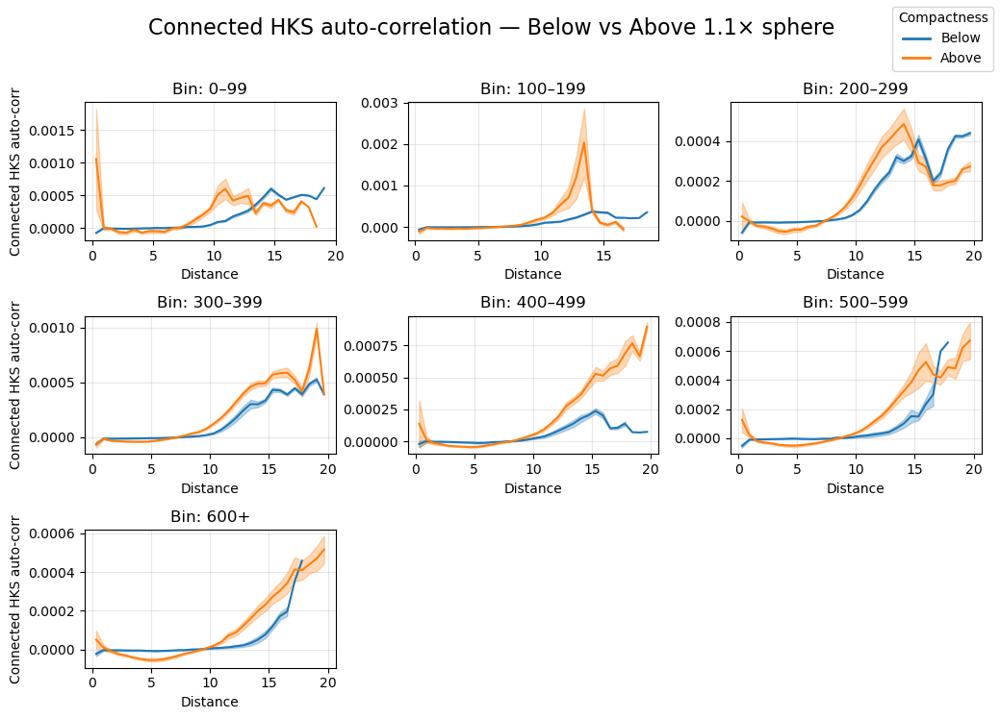

In [244]:
import matplotlib.pyplot as plt
import numpy as np

# --- Parameters ---
compactness_threshold = 1.1  # relative to sphere
color_below = 'tab:blue'
color_above = 'tab:orange'

n_bins = len(bin_labels)
n_cols = 3
n_rows = int(np.ceil(n_bins / n_cols))

fig, axes = plt.subplots(
    n_rows, n_cols,
    figsize=(3.5 * n_cols, 2.5 * n_rows),
    sharex=False, sharey=False,
    constrained_layout=True
)
axes = axes.ravel()

for b_idx, bin_label in enumerate(bin_labels):
    ax = axes[b_idx]
    org_refs = binned_organoids_by_cellnum[bin_label]
    if len(org_refs) == 0:
        ax.set_visible(False)
        continue

    below_curves = []
    above_curves = []

    for tp, org_idx in org_refs:
        Corr_conn = results[tp]['Corr_conn_all']  # (n_org, B, F, F)
        if org_idx >= Corr_conn.shape[0]:
            continue

        # Compute normalized compactness
        area = results[tp]['total_area'][org_idx]
        vol = results[tp]['total_volume'][org_idx]
        comp_norm = (area / (vol ** (2/3))) / comp_sphere

        curve = Corr_conn[org_idx, :, 0, 0]  # HKS auto-correlation (l>0)
        if comp_norm <= compactness_threshold:
            below_curves.append(curve)
        else:
            above_curves.append(curve)

    # Plot below threshold
    if len(below_curves) > 0:
        below_curves = np.vstack(below_curves)
        mean_below = np.nanmean(below_curves, axis=0)
        sem_below = np.nanstd(below_curves, axis=0, ddof=1) / np.sqrt(below_curves.shape[0])
        ax.plot(bin_centers, mean_below, color=color_below, label='Below')
        ax.fill_between(bin_centers, mean_below - sem_below, mean_below + sem_below,
                        color=color_below, alpha=0.3)

    # Plot above threshold
    if len(above_curves) > 0:
        above_curves = np.vstack(above_curves)
        mean_above = np.nanmean(above_curves, axis=0)
        sem_above = np.nanstd(above_curves, axis=0, ddof=1) / np.sqrt(above_curves.shape[0])
        ax.plot(bin_centers, mean_above, color=color_above, label='Above')
        ax.fill_between(bin_centers, mean_above - sem_above, mean_above + sem_above,
                        color=color_above, alpha=0.3)

    ax.set_title(f"Bin: {bin_label}", fontsize=12)
    ax.grid(True, alpha=0.3)
    ax.set_xlabel("Distance")
    if b_idx % n_cols == 0:
        ax.set_ylabel("Connected HKS auto-corr")

# Hide any unused axes
for ax in axes[n_bins:]:
    ax.set_visible(False)

# Shared legend
handles = [
    plt.Line2D([0], [0], color=color_below, lw=2, label='Below'),
    plt.Line2D([0], [0], color=color_above, lw=2, label='Above'),
]
fig.legend(handles, ["Below", "Above"], loc="upper right", title="Compactness")

fig.suptitle(
    f"Connected HKS auto-correlation — Below vs Above {compactness_threshold:.1f}× sphere",
    fontsize=16
)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


/tmp/ipykernel_3417093/3513332645.py:49: RuntimeWarning: Mean of empty slice
  mean_below = np.nanmean(below_profiles, axis=0)
/tmp/ipykernel_3417093/3513332645.py:60: RuntimeWarning: Mean of empty slice
  mean_above = np.nanmean(above_profiles, axis=0)


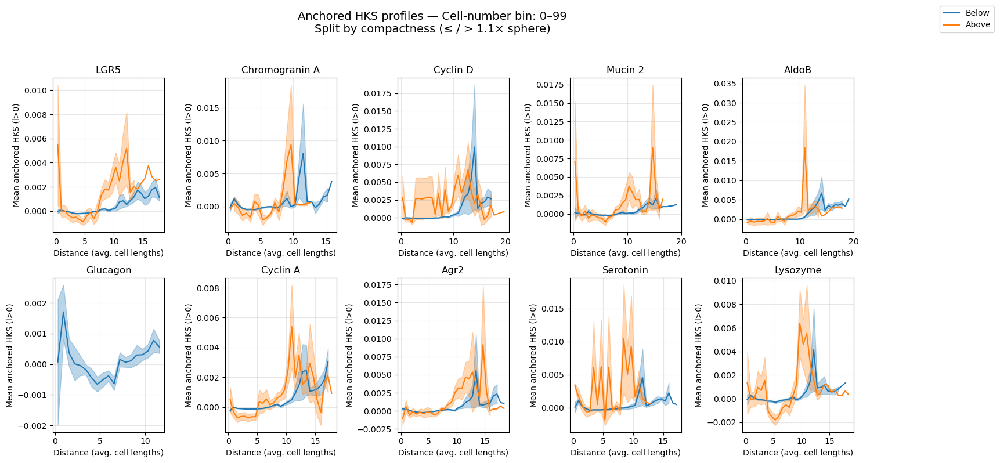

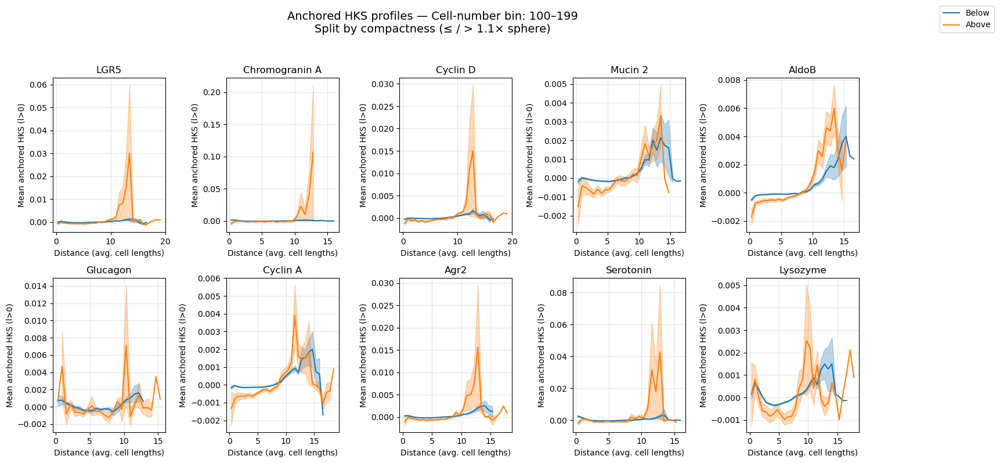

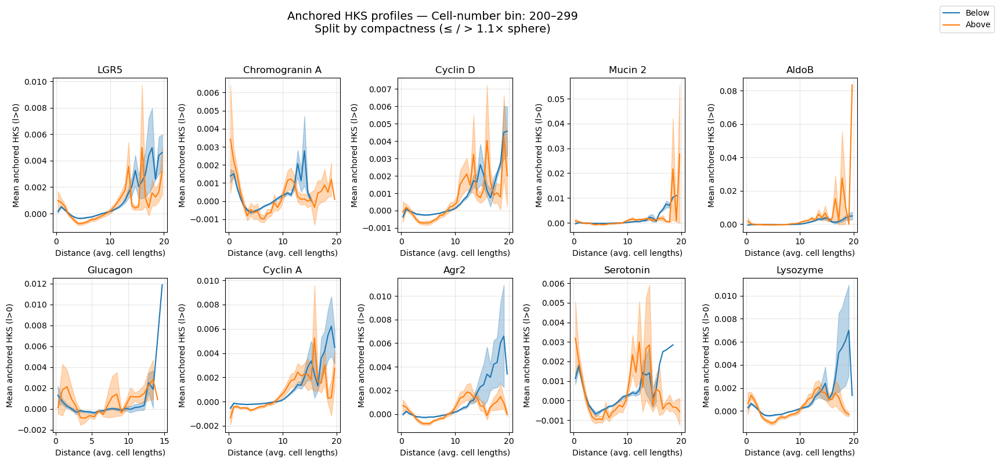

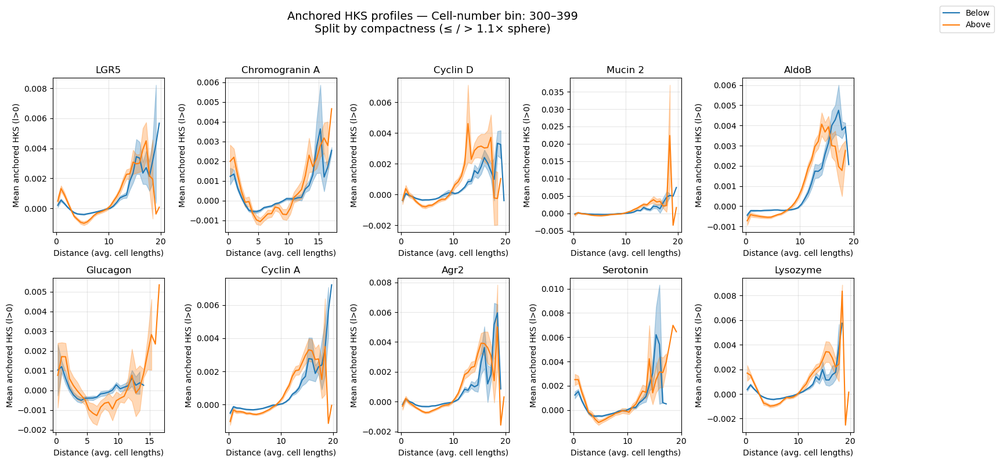

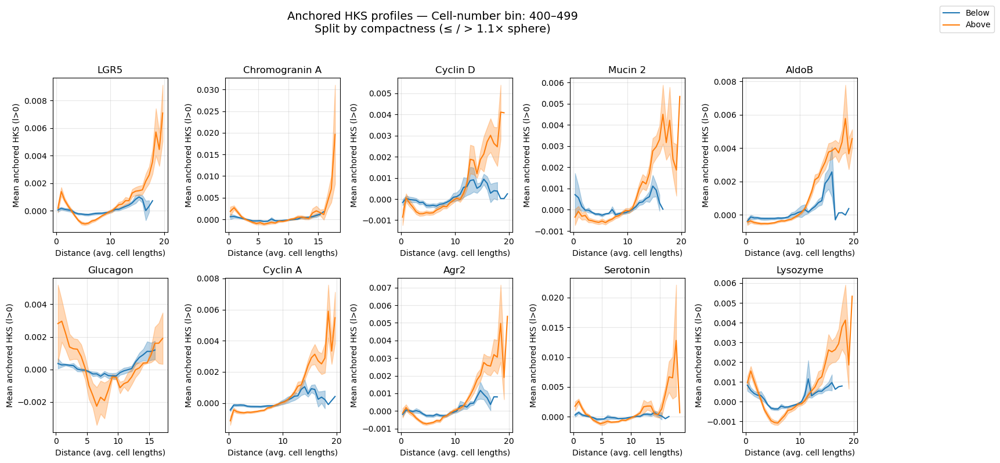

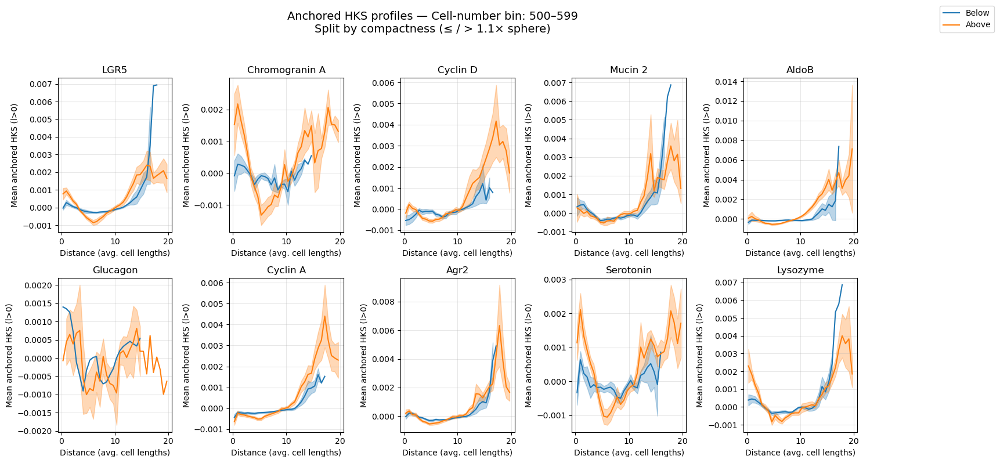

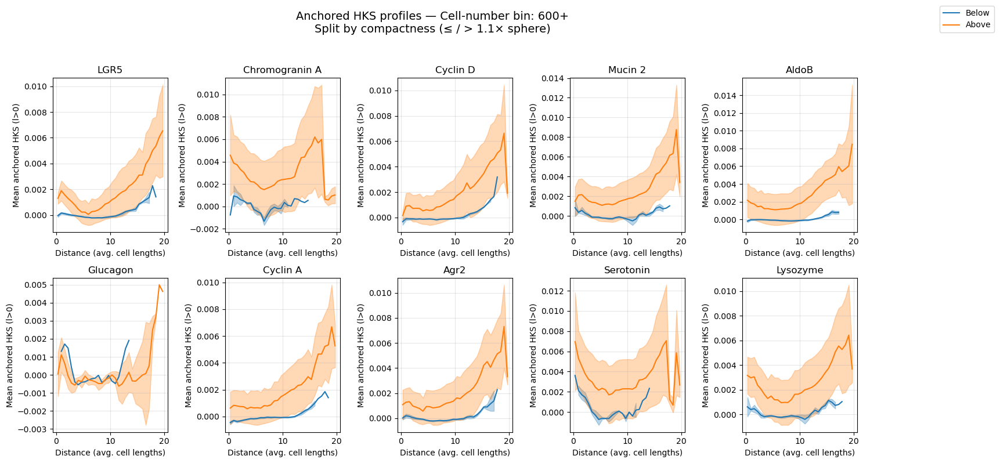

In [245]:
# ------------------------------
# Plot by CELL NUMBER BIN, split by compactness
# ------------------------------
compactness_threshold = 1.1  # relative to sphere

for bin_label in bin_labels:
    org_refs = binned_organoids_by_cellnum[bin_label]
    if len(org_refs) == 0:
        continue

    # --- Prepare figure for this bin ---
    fig, axes = plt.subplots(
        2, int(np.ceil(num_markers / 2)),
        figsize=(3 * int(np.ceil(num_markers / 2)), 8),
        sharex=False, sharey=False
    )
    axes = axes.ravel()

    legend_handles = []
    legend_labels = []

    for m_idx in range(num_markers):
        ax = axes[m_idx]

        below_profiles = []
        above_profiles = []

        # --- Collect profiles for organoids in this bin ---
        for tp, org_idx in org_refs:
            profiles_tp = results[tp]['hks_profile_all']
            if org_idx >= profiles_tp.shape[0]:
                continue

            # Compute normalized compactness for this organoid
            area = results[tp]['total_area'][org_idx]
            vol = results[tp]['total_volume'][org_idx]
            comp_norm = (area / (vol ** (2/3))) / comp_sphere

            profile = profiles_tp[org_idx, m_idx, :]

            if comp_norm <= compactness_threshold:
                below_profiles.append(profile)
            else:
                above_profiles.append(profile)

        # --- Plot below threshold ---
        if len(below_profiles) > 0:
            below_profiles = np.vstack(below_profiles)
            mean_below = np.nanmean(below_profiles, axis=0)
            sem_below = np.nanstd(below_profiles, axis=0, ddof=1) / np.sqrt(np.sum(~np.isnan(below_profiles), axis=0))
            line_below, = ax.plot(bin_centers, mean_below, '-', color='tab:blue', label='Below')
            ax.fill_between(bin_centers, mean_below - sem_below, mean_below + sem_below, alpha=0.3, color='tab:blue')
            if 'Below' not in legend_labels:
                legend_handles.append(line_below)
                legend_labels.append('Below')

        # --- Plot above threshold ---
        if len(above_profiles) > 0:
            above_profiles = np.vstack(above_profiles)
            mean_above = np.nanmean(above_profiles, axis=0)
            sem_above = np.nanstd(above_profiles, axis=0, ddof=1) / np.sqrt(np.sum(~np.isnan(above_profiles), axis=0))
            line_above, = ax.plot(bin_centers, mean_above, '-', color='tab:orange', label='Above')
            ax.fill_between(bin_centers, mean_above - sem_above, mean_above + sem_above, alpha=0.3, color='tab:orange')
            if 'Above' not in legend_labels:
                legend_handles.append(line_above)
                legend_labels.append('Above')

        ax.set_title(marker_names[m_idx])
        ax.set_xlabel("Distance (avg. cell lengths)")
        ax.set_ylabel("Mean anchored HKS (l>0)")
        ax.grid(True, alpha=0.3)

    # Remove unused subplots if any
    for ax in axes[num_markers:]:
        ax.axis('off')

    fig.suptitle(
        f"Anchored HKS profiles — Cell-number bin: {bin_label}\nSplit by compactness (≤ / > {compactness_threshold:.1f}× sphere)",
        fontsize=14
    )
    fig.legend(legend_handles, legend_labels, loc="upper right", bbox_to_anchor=(1.15, 1))
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


/tmp/ipykernel_3417093/3393404395.py:54: RuntimeWarning: Mean of empty slice
  mean_above = np.nanmean(above_curves, axis=0)


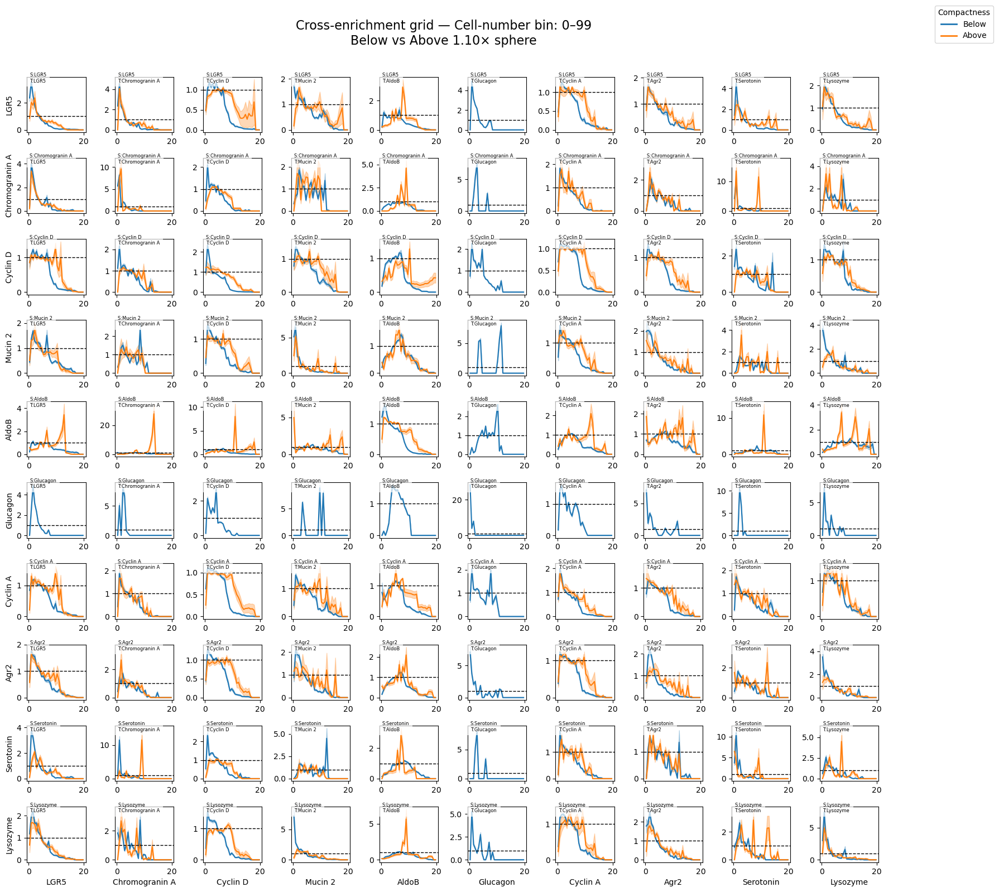

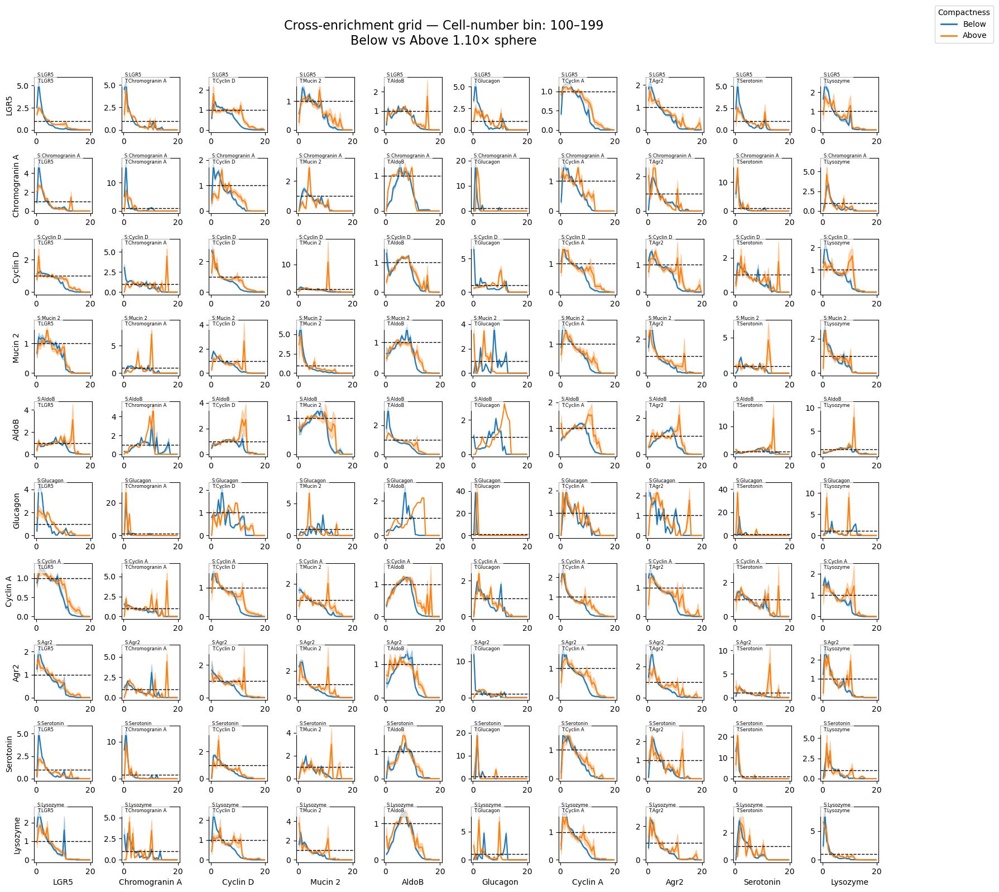

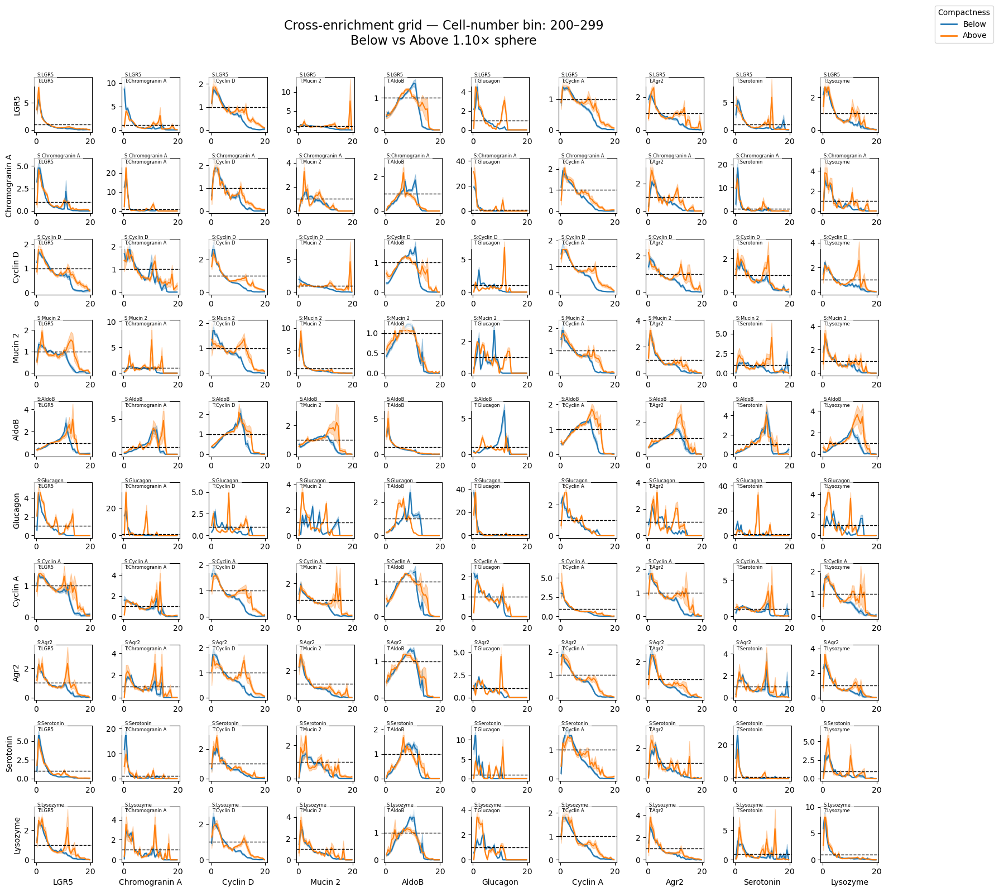

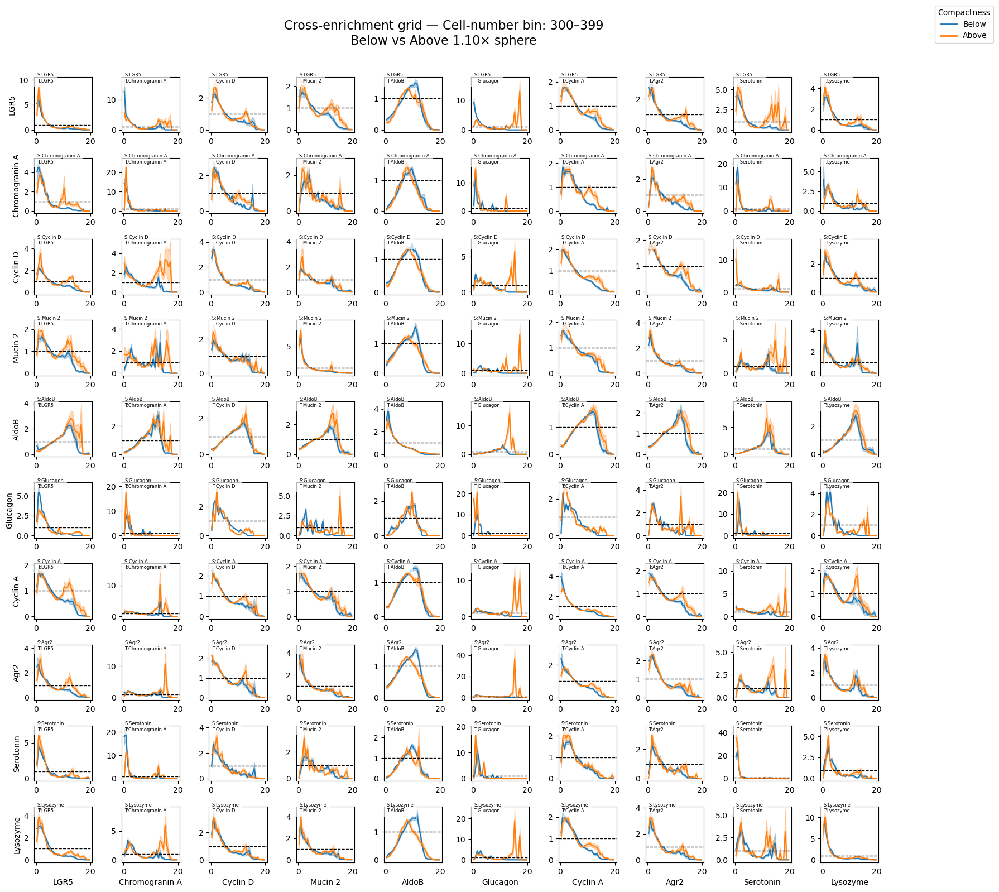

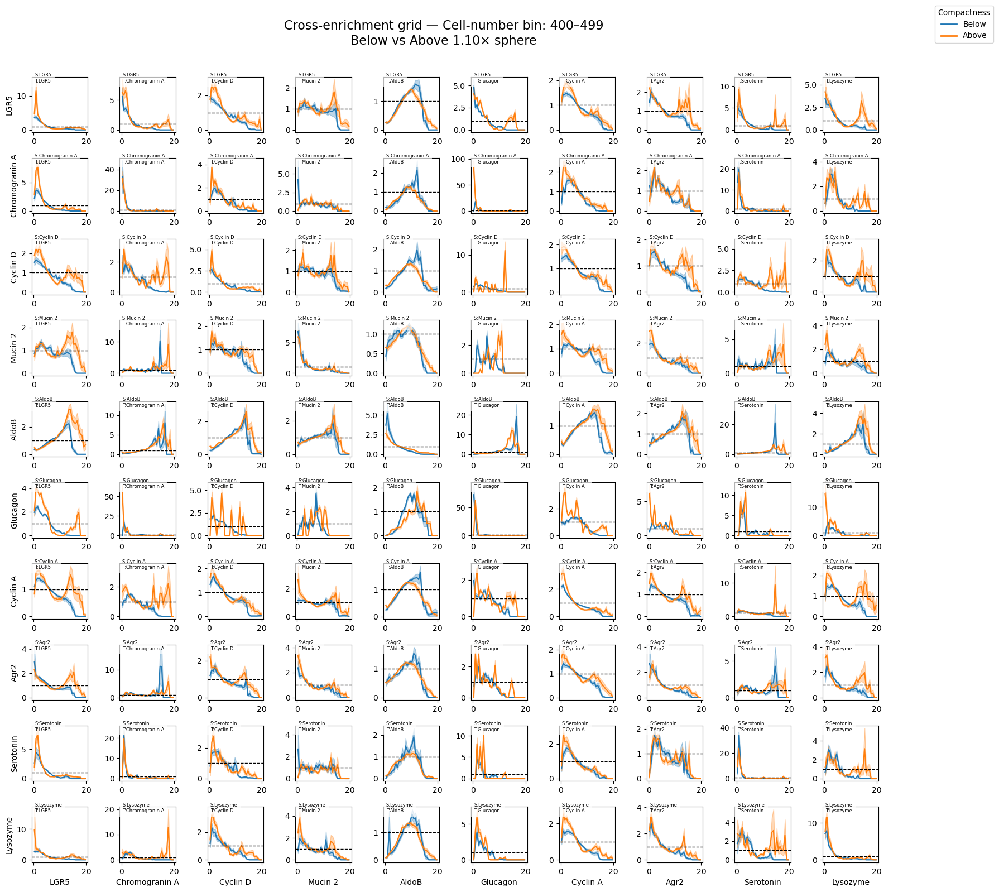

/tmp/ipykernel_3417093/3393404395.py:45: RuntimeWarning: Mean of empty slice
  mean_below = np.nanmean(below_curves, axis=0)


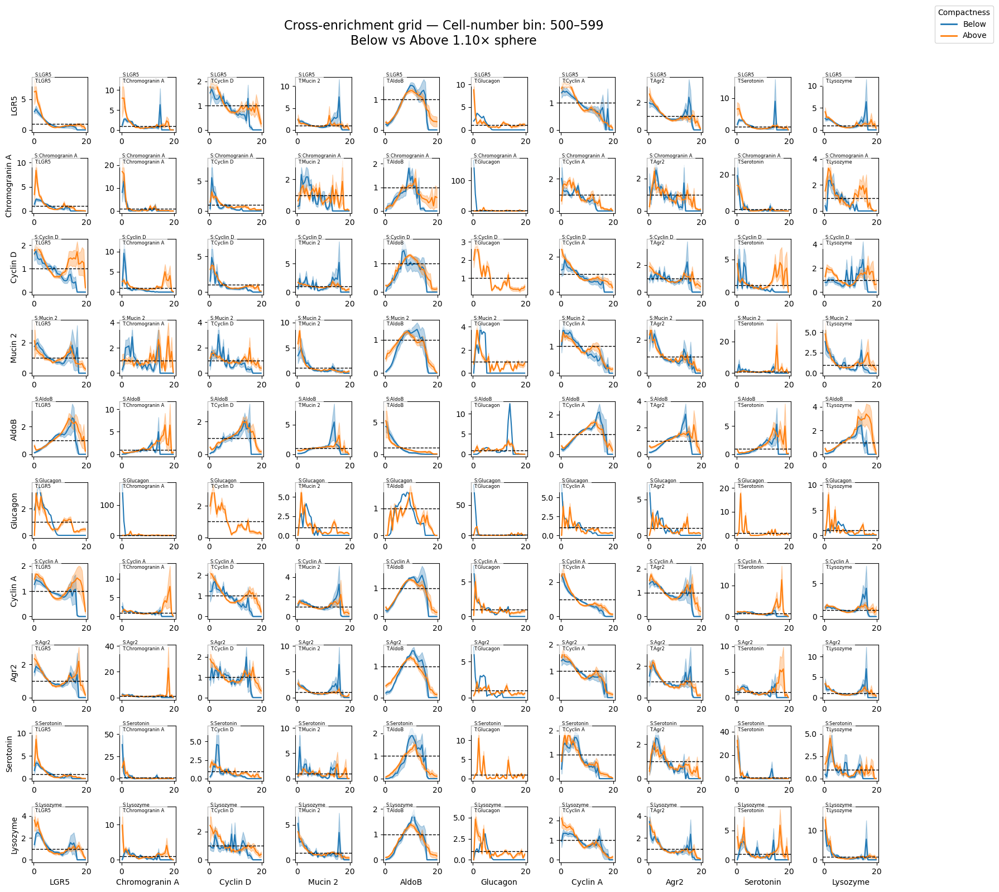

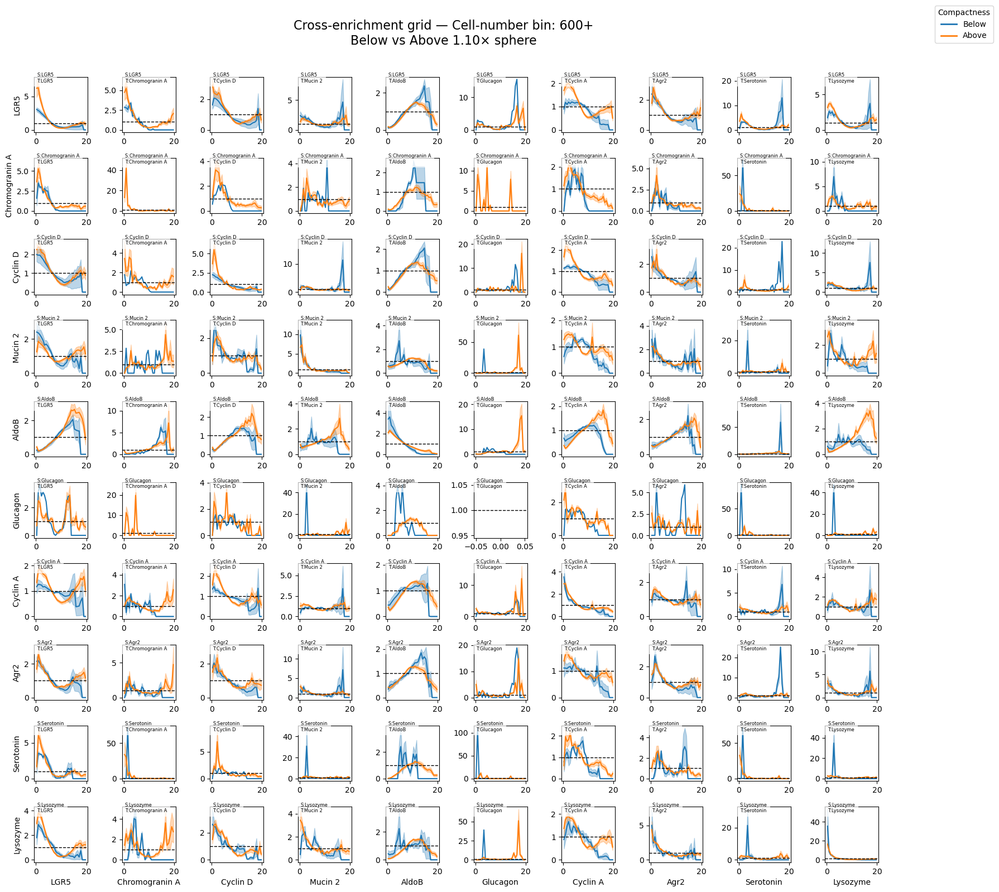

In [246]:
# -------------------- Plot cross-enrichment grids, split by compactness --------------------
compactness_threshold = 1.1  # relative to sphere
color_below = 'tab:blue'
color_above = 'tab:orange'

for bin_label in bin_labels:
    org_refs = binned_organoids_by_cellnum[bin_label]
    if len(org_refs) == 0:
        continue

    fig, axes = plt.subplots(
        n_markers, n_markers,
        figsize=(16, 16),
        sharex=False, sharey=False
    )

    for i_source in range(n_markers):
        for j_target in range(n_markers):
            ax = axes[i_source, j_target]

            below_curves = []
            above_curves = []

            # --- Collect enrichment curves for organoids in this bin ---
            for tp, org_idx in org_refs:
                Enrich = results[tp]["Enrichment_all"]  # (n_org, M, B, M)
                if org_idx >= Enrich.shape[0]:
                    continue

                # Compactness classification
                area = results[tp]['total_area'][org_idx]
                vol = results[tp]['total_volume'][org_idx]
                comp_norm = (area / (vol ** (2/3))) / comp_sphere

                curve = Enrich[org_idx, i_source, :, j_target]

                if comp_norm <= compactness_threshold:
                    below_curves.append(curve)
                else:
                    above_curves.append(curve)

            # --- Plot below threshold ---
            if len(below_curves) > 0:
                below_curves = np.vstack(below_curves)
                mean_below = np.nanmean(below_curves, axis=0)
                sem_below = np.nanstd(below_curves, axis=0, ddof=1) / np.sqrt(below_curves.shape[0])
                ax.plot(bin_centers, mean_below, color=color_below, label='Below')
                ax.fill_between(bin_centers, mean_below - sem_below, mean_below + sem_below,
                                alpha=0.3, color=color_below)

            # --- Plot above threshold ---
            if len(above_curves) > 0:
                above_curves = np.vstack(above_curves)
                mean_above = np.nanmean(above_curves, axis=0)
                sem_above = np.nanstd(above_curves, axis=0, ddof=1) / np.sqrt(above_curves.shape[0])
                ax.plot(bin_centers, mean_above, color=color_above, label='Above')
                ax.fill_between(bin_centers, mean_above - sem_above, mean_above + sem_above,
                                alpha=0.3, color=color_above)

            ax.axhline(1.0, color='k', linestyle='--', linewidth=1)

            # Axis labels
            if i_source == n_markers - 1:
                ax.set_xlabel(f"{marker_names[j_target]}", fontsize=10)
            if j_target == 0:
                ax.set_ylabel(f"{marker_names[i_source]}", fontsize=10)

            ax.tick_params(axis='both', which='major', labelsize=10)

            # Add label inside subplot for quick identification
            ax.text(0.05, 0.9,
                    f"S:{marker_names[i_source]}\nT:{marker_names[j_target]}",
                    transform=ax.transAxes, fontsize=6, color='black',
                    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

    # Shared legend for below/above curves
    handles = [
        plt.Line2D([0], [0], color=color_below, lw=2, label='Below'),
        plt.Line2D([0], [0], color=color_above, lw=2, label='Above')
    ]
    fig.legend(handles=handles, loc="upper right", bbox_to_anchor=(1.12, 1.0), title="Compactness")

    fig.suptitle(
        f"Cross-enrichment grid — Cell-number bin: {bin_label}\nBelow vs Above {compactness_threshold:.2f}× sphere",
        fontsize=16
    )
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()
